train text split 

for em cada linha do dataframe
 - 


### Analyze the dataset distrinution to define the Regression to apply

Exploratory diagnostics (scatter, LOESS, residuals)

In [1]:
# %% [0] Imports & Config
import glob
import pathlib
import ast
import warnings
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Global constants
SEED = 42  # Global random seed for reproducibility

# Set global matplotlib settings for consistent high-quality plots
plt.rcParams['figure.dpi'] = 300        # Display resolution
plt.rcParams['savefig.dpi'] = 300       # Saved figure resolution
plt.rcParams['figure.figsize'] = (8, 6) # Default figure size
plt.rcParams['savefig.bbox'] = 'tight'  # Tight bounding box
plt.rcParams['savefig.pad_inches'] = 0.1 # Slight padding

# Set numpy random seed for reproducibility
np.random.seed(SEED)

import torch  # required by TabNet
# ─── monkey-patch out torch._compile → identity to avoid torch._dynamo / sympy errors ───
if hasattr(torch, "_compile"):
    torch._compile = lambda fn, **kwargs: fn
    
# Set torch random seed for reproducibility
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

from pygam import LinearGAM, s

from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import TransformedTargetRegressor

# regressors
from sklearn.linear_model import (
    Lasso, LinearRegression, Ridge, BayesianRidge,
    HuberRegressor, RANSACRegressor,
    TheilSenRegressor, QuantileRegressor
)
from sklearn.ensemble import (
    RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from pytorch_tabnet.tab_model import TabNetRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

# diagnostics
from scipy import stats
import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess
import statsmodels.stats.api as sms

# Set seaborn style for better plot aesthetics
sns.set_style("whitegrid")

# Suppress common warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)



# %% [1] Helpers
_num_re = re.compile(r"[-+]?\d*\.\d+|\d+")  # Regex pattern to extract numbers from strings

def extract_nums(cell):
    """
    Extract numerical values from a cell that may contain strings, lists, or other formats
    Returns a numpy array of floats
    """
    if pd.isna(cell):
        return np.array([], float)
    s = str(cell)
    try:
        # Try to parse the cell as a literal Python expression (list, tuple, etc.)
        return np.asarray(ast.literal_eval(s), float).ravel()
    except Exception:
        # Fall back to regex matching if the cell isn't a valid Python literal
        return np.asarray([float(x) for x in _num_re.findall(s)], float)

def safe_metrics(y_true, y_pred):
    """
    Calculate regression metrics safely handling NaN values
    Returns RMSE, MAE, and R² (or NaN if calculation isn't possible)
    """
    valid = ~np.isnan(y_pred)
    if valid.sum() == 0:  # No valid predictions
        return np.nan, np.nan, np.nan
    yt, yp = y_true[valid], y_pred[valid]
    rmse = np.sqrt(mean_squared_error(yt, yp))
    mae  = mean_absolute_error(yt, yp)
    r2   = r2_score(yt, yp) if len(yt) > 1 else np.nan  # R² requires at least 2 points
    return rmse, mae, r2



# %% [2] Load & label each CSV
def load_csv(path):
    """
    Load and process a CSV file containing depth and distance values
    Returns a DataFrame with inv_depth (1/depth), distance, and source columns
    """
    df = pd.read_csv(path)
    df.columns = df.columns.str.strip().str.lower()  # Standardize column names

    ## Changing values for the reference distances
    convert_dict = {97.03452097: 95.4972374999314,
                    132.67746731: 130.27030956792788,
                    182.81089: 180.0310108131289,
                    238.42127226: 235.42859654318062,
                    296.38054131: 293.236947560716,
                    325.82715964: 322.6227772103269,
                    267.20685889: 264.133252280173,
                    210.19780552: 207.30061676158186,
                    156.71269605: 154.08651552205345,
                    112.05005222: 109.98087608564406,
                    90.47079257: 89.6779908953997}    
    # Filter out rows marked to ignore
    if "ignore" in df:
        df = df[pd.to_numeric(df["ignore"], errors="coerce").fillna(0) != 1]
        
    rows = []
    for _, row in df.iterrows():
        # Extract numerical depth and distance values
        depths = extract_nums(row.get("ref_depth_values", np.nan))
        dists  = extract_nums(row.get("ref_distance_values", np.nan))
        dist  = np.array(map(lambda x: convert_dict[x], dists)) if len(dists) > 0 else np.array([])
        # Skip if no data points
        n = min(len(depths), len(dists))
        if n == 0:
            continue
            
        # Match corresponding depths and distances
        depths, dists = depths[:n], dists[:n]
        valid = (depths > 0) & ~np.isnan(dists)  # Filter for valid data points
        
        # Create a row for each valid depth-distance pair
        for di, yi in zip(depths[valid], dists[valid]):
            rows.append({
                "inv_depth": 1.0 / di,  # Store inverse depth (1/depth)
                "distance":  float(yi),
                "source":    pathlib.Path(path).name
            })
    return pd.DataFrame(rows)

# Find and load all CSV files in the results directory
files = glob.glob("./results/*.csv")
files = glob.glob("./csvs/*.csv")

if not files:
    raise FileNotFoundError("No CSVs under ./results/")
    
# Combine all CSV data into a single DataFrame
data = pd.concat([load_csv(f) for f in files], ignore_index=True)
print(f"Loaded {len(data)} samples from {len(files)} files")



c:\Users\plima\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Loaded 34084 samples from 67 files


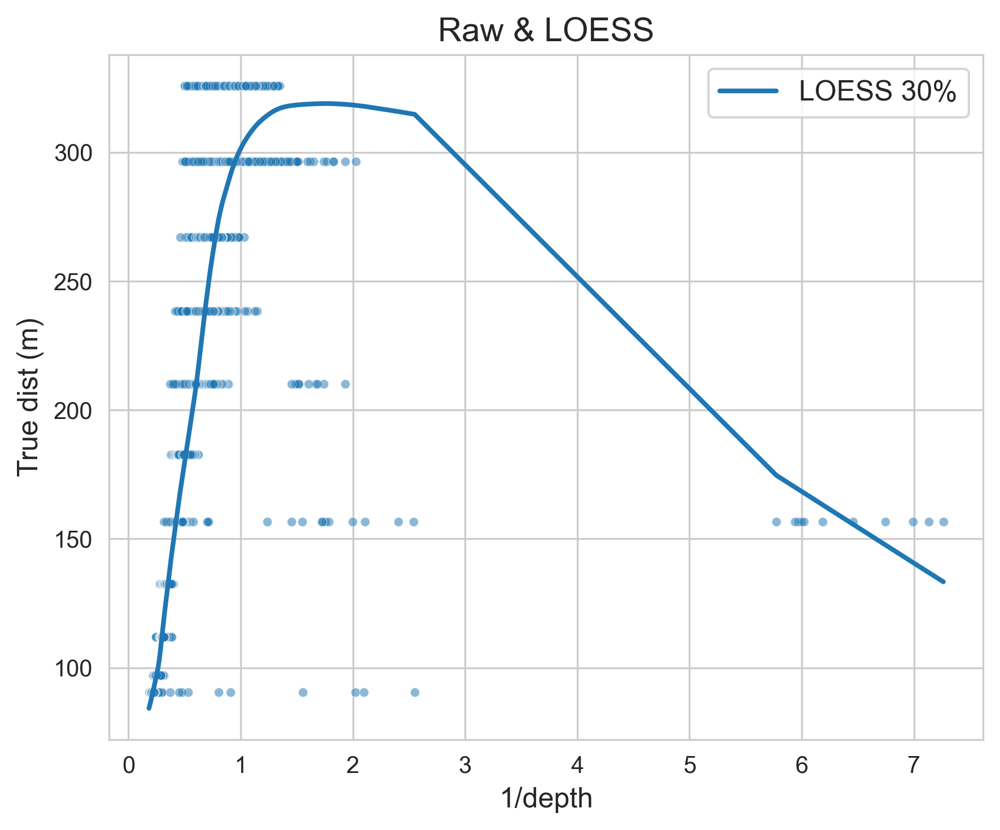


### Global Performance ###


,RMSE,MAE,R²
model,,,
Linear,49.2714,29.7279,0.6044
Quadratic,30.4582,19.4639,0.8488


In [2]:
# %% [3] Global LOESS & Linear vs Quadratic
# Create scatter plot of raw data
plt.figure(figsize=(6,5))
sns.scatterplot(data=data, x="inv_depth", y="distance", s=15, alpha=0.3)
plt.savefig("figs_out/scatter_inv_depth_vs_distance.png", dpi=300)  # DPI handled by global setting

# Apply LOESS smoothing (Locally Weighted Scatterplot Smoothing)
# frac=0.3 means each smoothed value uses 30% of the data points
lo = lowess(data.distance, data.inv_depth, frac=0.3, return_sorted=True)

# Plot the LOESS curve over the scatter plot
plt.plot(lo[:,0], lo[:,1], lw=2, label="LOESS 30%")
plt.xlabel("1/depth", fontsize=12)
plt.ylabel("True dist (m)", fontsize=12)
plt.title("Raw & LOESS", fontsize=14)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("figs_out/loess_global.png", dpi=300)  # DPI handled by global setting
plt.show()

# Extract features and target for modeling
X_all = data[["inv_depth"]].values  # Feature (inverse depth)
y_all = data["distance"].values     # Target (distance)

# Fit basic linear and quadratic models for comparison
lin  = LinearRegression().fit(X_all, y_all)                               # y = ax + b
quad = make_pipeline(PolynomialFeatures(2), LinearRegression()).fit(X_all, y_all)  # y = ax² + bx + c

print("\n### Global Performance ###")
repo = []
for name, m in {"Linear": lin, "Quadratic": quad}.items():
    yhat = m.predict(X_all)
    repo.append((name, *safe_metrics(y_all, yhat)))
display(
    pd.DataFrame(repo, columns=["model","RMSE","MAE","R²"])
      .set_index("model").round(4)
)

# %% [4] Define regressors (expanded suite)
models = {
    # # Linear and polynomial models
    # "Linear":        LinearRegression(),  # Simple linear regression
    # "Quadratic":     make_pipeline(PolynomialFeatures(2), LinearRegression()),  # 2nd degree polynomial
    
    # # # Regularized linear models
    # "Ridge":         Ridge(random_state=SEED),  # L2 regularization
    # "Lasso":         Lasso(alpha=0.1, random_state=SEED),  # L1 regularization
    # "BayesianRidge": BayesianRidge(),  # Bayesian approach to ridge regression
    
    # # Tree-based models
    "DecisionTree":  DecisionTreeRegressor(random_state=SEED),  # Single decision tree
    "RandomForest":  RandomForestRegressor(n_estimators=100, random_state=SEED),  # Ensemble of trees
    "GradientBoost": GradientBoostingRegressor(n_estimators=100, random_state=SEED),  # Gradient boosting
    "AdaBoost":      AdaBoostRegressor(n_estimators=100, random_state=SEED),  # Adaptive boosting
    
    # # Advanced gradient boosting libraries
    "XGBoost":       XGBRegressor(n_estimators=100, verbosity=0, random_state=SEED),
    "CatBoost":      CatBoostRegressor(n_estimators=100, verbose=False, random_state=SEED),
    "NGBoost":       NGBRegressor(n_estimators=100, random_state=SEED),  # Natural gradient boosting
    # "TabNet":        TabNetRegressor(
    #                      input_dim=1,
    #                      output_dim=1,
    #                      n_d=8, n_a=8, n_steps=50, gamma=1.3,
    #                      cat_idxs=[], cat_dims=[], cat_emb_dim=1,
    #                      n_independent=2, n_shared=2,
    #                      epsilon=1e-15, momentum=0.02, lambda_sparse=0.001,
    #                      seed=SEED, verbose=0,
    #                      optimizer_fn=torch.optim.Adam,
    #                      optimizer_params={"lr": 2e-2},
    #                      scheduler_fn=torch.optim.lr_scheduler.ReduceLROnPlateau,
    #                      scheduler_params={"mode":"min","patience":5,"factor":0.5},
    #                      mask_type="entmax",
    #                      device_name="auto",
    #                      n_shared_decoder=1, n_indep_decoder=1,
    #                      grouped_features=[]
    #                  ),
    
    # # Kernel methods
    # "SVR (RBF)":     SVR(kernel="rbf", C=1.0, epsilon=5.0),  # Support vector regression
    # "KernelRidge":   KernelRidge(alpha=1.0, kernel="rbf"),   # Kernel ridge regression
    # # "GaussianProc":  GaussianProcessRegressor(kernel=RBF(1.0), alpha=1e-2, normalize_y=True, random_state=SEED),
    
    # Other algorithms
    "KNN":           KNeighborsRegressor(n_neighbors=5)
    # ,     # k-nearest neighbors
    # "Huber":         HuberRegressor(),                       # Robust to outliers
    # "RANSAC":        RANSACRegressor(random_state=SEED),     # Robust random sample consensus
    # "Theil–Sen":     TheilSenRegressor(random_state=SEED),   # Robust to outliers
    # "Quantile":      QuantileRegressor(quantile=0.5, alpha=0.0),  # Median regression

    
    # # LightGBM configurations
    # "LightGBM":      LGBMRegressor(
    #                      n_estimators=100,
    #                      random_state=SEED,
    #                      verbose=0,
    #                      min_child_samples=5,   # Increased from 1
    #                      min_data_in_bin=3,     # Increased from 1
    #                      min_child_weight=1e-3, # Added minimum child weight
    #                      reg_lambda=1.0,        # Added L2 regularization
    #                      reg_alpha=0.0,         # Added L1 regularization 
    #                      max_bin=255
    #                  ),
    # # Conservative parameters for very small datasets
    # "LightGBM_small_data": LGBMRegressor(
    #     n_estimators=50,           # Reduced number of trees
    #     learning_rate=0.05,        # Smaller learning rate
    #     min_child_samples=10,      # Higher minimum samples in leaf
    #     min_data_in_bin=5,         # More data per bin
    #     min_child_weight=1e-2,     # Higher child weight requirement
    #     reg_lambda=2.0,            # Stronger L2 regularization
    #     subsample=0.8,             # Use only 80% of data per tree
    #     colsample_bytree=0.8,      # Use only 80% of features per tree
    #     random_state=SEED,         # Using global seed
    #     # Removed early_stopping_rounds as it requires validation data
    # ),
    # # Feature engineering approach with polynomial features
    # "LightGBM_with_poly_features": make_pipeline(
    #     PolynomialFeatures(degree=2, include_bias=False),
    #     LGBMRegressor(
    #         n_estimators=100,
    #         min_child_samples=5,
    #         min_data_in_bin=3,
    #         reg_lambda=1.0,
    #         random_state=SEED     # Using global seed
    #     )
    # ),
    
    # # Other approaches
    # "GAM":           LinearGAM(s(0, n_splines=20)),  # Generalized Additive Model
    # "log_lin":       TransformedTargetRegressor(     # Log-transform target
    #                      regressor=LinearRegression(),
    #                      func=np.log,
    #                      inverse_func=np.exp
    #                  )
}



# %% [5] Per-file 10-fold CV & collect predictions
# Set up cross-validation with consistent random seed
kf = KFold(n_splits=10, shuffle=True, random_state=SEED)

# Initialize containers to store predictions and metrics
cv_preds  = {n: {"y_true": [], "y_pred": []} for n in models}  # Store all predictions for global metrics
file_rmse = {n: [] for n in models}  # Store per-file RMSE values
file_mae  = {n: [] for n in models}  # Store per-file MAE values


In [3]:
for src, grp in data.groupby("source"):
    X, y = grp[["inv_depth"]].values, grp["distance"].values
    if len(y) < 10:
        continue

    rmses = {n: [] for n in models}
    maes  = {n: [] for n in models}

    for train_idx, test_idx in kf.split(X):
        Xt, yt = X[train_idx], y[train_idx]
        Xv, yv = X[test_idx],  y[test_idx]

        for name, mdl in models.items():
            print(name)
            # continue # Skip models that are already evaluated in the previous loop
            if name == "TabNet":
                mdl.fit(Xt, yt.reshape(-1,1))
                yhat = mdl.predict(Xv).reshape(-1)
            elif name.startswith("LightGBM"):
                # For LightGBM models, we need to be careful with early stopping
                # Create a validation set from training data for early stopping if needed
                # Here we'll use 80% for training and 20% for validation
                
                # Check if this is a pipeline (LightGBM_with_poly_features case)
                if hasattr(mdl, 'steps'):
                    # For pipeline, we can't easily use eval_set
                    mdl.fit(Xt, yt)
                # For LightGBM_small_data, don't use early stopping as it's been removed
                elif name == "LightGBM_small_data":
                    # Simple fit without early stopping
                    mdl.fit(Xt, yt)
                # For other LightGBM models
                elif len(Xt) > 5:  # Only if we have enough samples
                    split_idx = int(0.8 * len(Xt))
                    X_train, X_val = Xt[:split_idx], Xt[split_idx:]
                    y_train, y_val = yt[:split_idx], yt[split_idx:]
                    
                    # For direct LightGBM models with early stopping
                    mdl.fit(
                        X_train, y_train,
                        eval_set=[(X_val, y_val)],
                        eval_metric='rmse'
                    )
                else:
                    # Not enough samples for validation split
                    mdl.fit(Xt, yt)
                
                yhat = mdl.predict(Xv)
            else:
                mdl.fit(Xt, yt)
                yhat = mdl.predict(Xv)

            rm, ma, _ = safe_metrics(yv, yhat)
            rmses[name].append(rm)
            maes[name].append(ma)
            cv_preds[name]["y_true"].extend(yv)
            cv_preds[name]["y_pred"].extend(yhat)

    for name in models:
        file_rmse[name].append(np.nanmean(rmses[name]))
        file_mae[name].append(np.nanmean(maes[name]))


DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7805 val_loss=0.0000 scale=2.0000 norm=137.8685
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7809 val_loss=0.0000 scale=2.0000 norm=137.9763
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7800 val_loss=0.0000 scale=2.0000 norm=137.8100
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7785 val_loss=0.0000 scale=2.0000 norm=137.6499
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7796 val_loss=0.0000 scale=2.0000 norm=137.7436
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7807 val_loss=0.0000 scale=2.0000 norm=137.9469
KNN
DecisionTree
RandomForest
GradientBoost
AdaBoost
XGBoost
CatBoost
NGBoost
[iter 0] loss=5.7800 val_loss=0.0000 scale=2.0000 norm=137.8727
KNN
Decisi

In [4]:
# %% [6] Aggregate & save metrics
rows = []
for name in models:
    m_rmse = np.nanmean(file_rmse[name])
    m_mae  = np.nanmean(file_mae[name])
    yt_all = np.array(cv_preds[name]["y_true"])
    yp_all = np.array(cv_preds[name]["y_pred"])
    m_r2   = r2_score(yt_all, yp_all)
    rows.append({
        "model":         name,
        "Mean CV RMSE":  m_rmse,
        "Mean CV MAE":   m_mae,
        "Global CV R²":  m_r2
    })

agg_df = pd.DataFrame(rows).set_index("model").round(3).sort_values("Mean CV RMSE")
print("\n### 10-Fold CV by CSV ###")
display(agg_df)
agg_df.to_csv("per_file_cv_metrics.csv")

top2 = agg_df.index[:2].tolist()
print("Top-2 models:", top2)





### 10-Fold CV by CSV ###


,Mean CV RMSE,Mean CV MAE,Global CV R²
model,,,
RandomForest,22.381,18.657,0.929
CatBoost,24.905,21.740,0.933
GradientBoost,25.162,21.592,0.935
DecisionTree,25.836,21.250,0.910
NGBoost,26.073,23.789,0.917
AdaBoost,26.193,23.474,0.919
KNN,26.306,23.115,0.928
XGBoost,26.572,22.391,0.931


Top-2 models: ['RandomForest', 'CatBoost']


In [5]:
print(agg_df.to_latex().replace('000','') )


\begin{tabular}{lrrr}
\toprule
 & Mean CV RMSE & Mean CV MAE & Global CV R² \\
model &  &  &  \\
\midrule
RandomForest & 22.381 & 18.657 & 0.929 \\
CatBoost & 24.905 & 21.740 & 0.933 \\
GradientBoost & 25.162 & 21.592 & 0.935 \\
DecisionTree & 25.836 & 21.250 & 0.910 \\
NGBoost & 26.073 & 23.789 & 0.917 \\
AdaBoost & 26.193 & 23.474 & 0.919 \\
KNN & 26.306 & 23.115 & 0.928 \\
XGBoost & 26.572 & 22.391 & 0.931 \\
\bottomrule
\end{tabular}



In [6]:

top2 = agg_df.index[:2].tolist()
print("Top-2 models:", top2)


Top-2 models: ['RandomForest', 'CatBoost']


95% CI ΔRMSE (RF−CB): [-3.605, -1.381]
RandomForest — Breusch–Pagan p=0.000e+00, Durbin–Watson=1.487
CatBoost — Breusch–Pagan p=0.000e+00, Durbin–Watson=1.261

--- Diagnostics & Stratified Errors for RandomForest ---


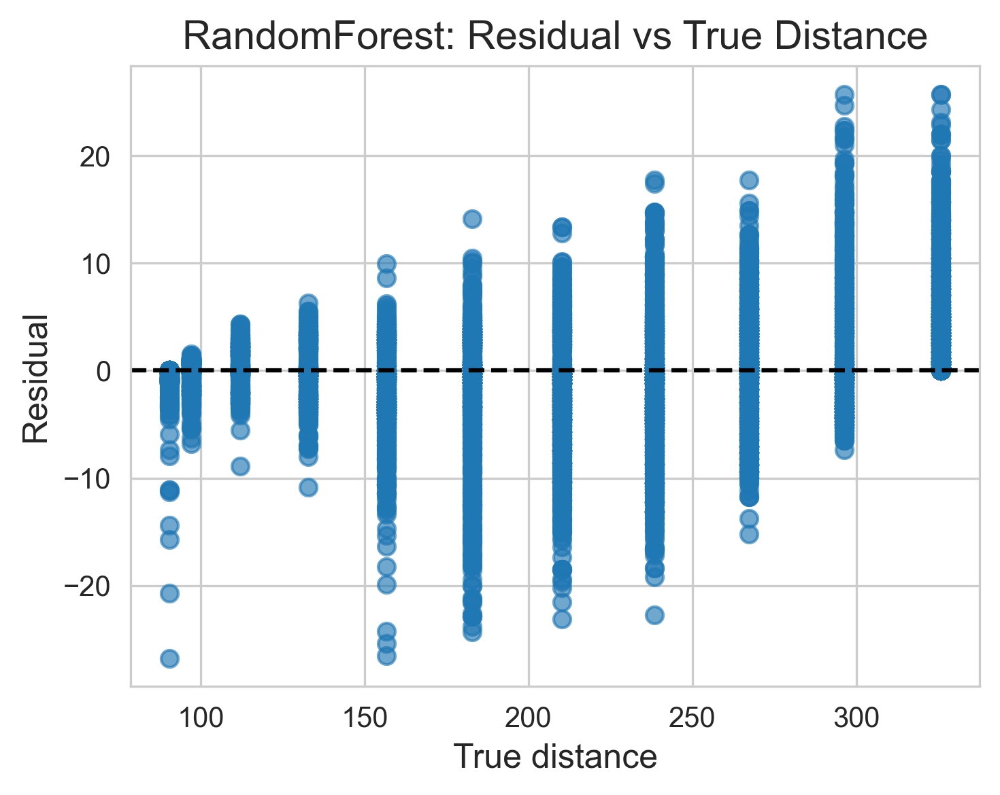

95% CI RMSE: [3.60708136 3.7388865 ]
95% CI MAE:  [1.70799852 1.77714421]

--- Diagnostics & Stratified Errors for CatBoost ---


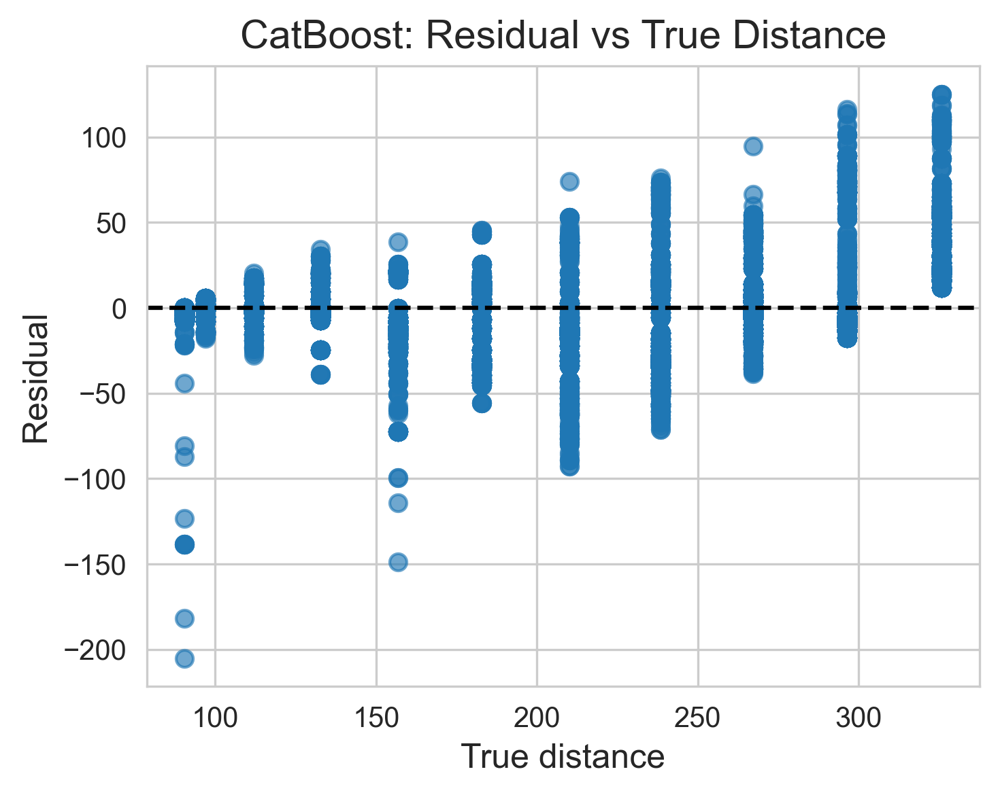

95% CI RMSE: [22.95885726 23.60924756]
95% CI MAE:  [14.61848053 15.0017385 ]


In [7]:

# %% [7] Paired bootstrap & basic stats for Top-2
def paired_bootstrap(a, b, n_boot=5000, alpha=0.05):
    """
    Perform paired bootstrap to compute confidence interval for the difference between two sets of measurements
    
    Parameters:
    - a, b: Arrays of measurements to compare
    - n_boot: Number of bootstrap iterations
    - alpha: Significance level (e.g., 0.05 for 95% CI)
    
    Returns:
    - Confidence interval bounds for the difference in means (a - b)
    """
    diffs = []
    n = len(a)
    for _ in range(n_boot):
        # Sample with replacement from the indices
        idx = np.random.randint(0, n, n)
        # Calculate the difference in means for this bootstrap sample
        diffs.append(np.mean(a[idx]) - np.mean(b[idx]))
    # Return the percentile-based confidence interval
    return np.percentile(diffs, [100*alpha/2, 100*(1-alpha/2)])

rf_rmse = np.array(file_rmse[top2[0]])
cb_rmse = np.array(file_rmse[top2[1]])
ci_low, ci_up = paired_bootstrap(rf_rmse, cb_rmse)
print(f"95% CI ΔRMSE (RF−CB): [{ci_low:.3f}, {ci_up:.3f}]")

for name in top2:
    mdl  = models[name].fit(X_all, y_all)
    yhat = mdl.predict(X_all).reshape(-1) if name=="TabNet" else mdl.predict(X_all)
    resid = y_all - yhat
    bp_p  = sms.het_breuschpagan(resid, sm.add_constant(yhat))[1]
    dw    = sms.durbin_watson(resid)
    print(f"{name} — Breusch–Pagan p={bp_p:.3e}, Durbin–Watson={dw:.3f}")



# %% [8] Diagnostics & residual‐vs‐distance for Top-2
for name in top2:
    print(f"\n--- Diagnostics & Stratified Errors for {name} ---")
    
    # Train model on all data
    mdl   = models[name].fit(X_all, y_all)
    
    # Generate predictions
    yhat  = mdl.predict(X_all).reshape(-1) if name=="TabNet" else mdl.predict(X_all)
    
    # Calculate residuals (errors)
    resid = y_all - yhat

    # Create residual plot
    plt.figure(figsize=(5,4))
    plt.scatter(y_all, resid, alpha=0.4)
    plt.axhline(0, color="k", ls="--")  # Zero line reference
    plt.xlabel("True distance", fontsize=12)
    plt.ylabel("Residual", fontsize=12)
    plt.title(f"{name}: Residual vs True Distance", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"figs_out/residual_vs_distance_{name}.png")  # DPI handled by global setting
    plt.show()

    # Bootstrap to get confidence intervals for error metrics
    rm_bs, ma_bs = [], []  # To store bootstrap results
    n = len(y_all)
    n_bootstrap = 2000
    
    # Set random seed for reproducibility
    np.random.seed(SEED)
    
    for _ in range(n_bootstrap):
        # Sample with replacement
        idx = np.random.randint(0, n, n)
        yt, yp = y_all[idx], yhat[idx]
        
        # Calculate metrics for this bootstrap sample
        rm_bs.append(np.sqrt(mean_squared_error(yt, yp)))
        ma_bs.append(mean_absolute_error(yt, yp))
        
    # Report 95% confidence intervals
    print("95% CI RMSE:", np.percentile(rm_bs, [2.5, 97.5]))
    print("95% CI MAE: ", np.percentile(ma_bs, [2.5, 97.5]))





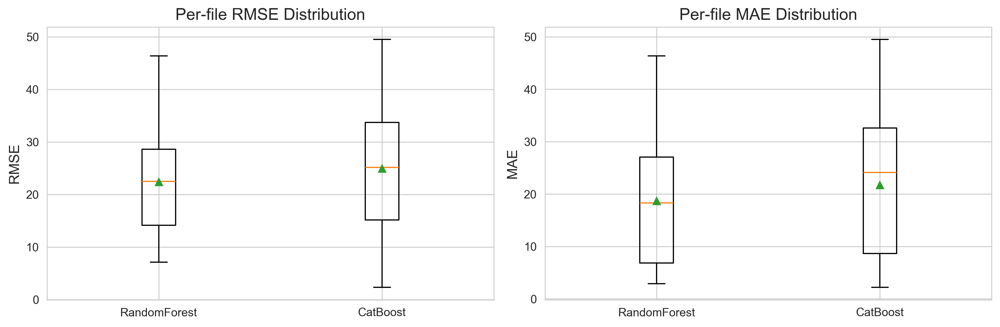

In [8]:
# %% [9] Error Distribution Comparison
# Create a side-by-side comparison of error distributions for top two models
fig, axes = plt.subplots(1, 2, figsize=(12,4))

# Left plot: RMSE distribution
axes[0].boxplot(
    [file_rmse[top2[0]], file_rmse[top2[1]]],  # Data for each model
    tick_labels=top2,        # Use model names as labels
    showmeans=True           # Show mean in addition to median
)
axes[0].set_title("Per-file RMSE Distribution", fontsize=14)
axes[0].set_ylabel("RMSE", fontsize=12)

# Right plot: MAE distribution
axes[1].boxplot(
    [file_mae[top2[0]], file_mae[top2[1]]],
    tick_labels=top2,
    showmeans=True
)
axes[1].set_title("Per-file MAE Distribution", fontsize=14)
axes[1].set_ylabel("MAE", fontsize=12)

# Finalize and save the figure
plt.tight_layout()
plt.savefig("figs_out/error_distribution_comparison.png")  # DPI handled by global setting
plt.show()

c:\Users\plima\anaconda3\Lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for sam

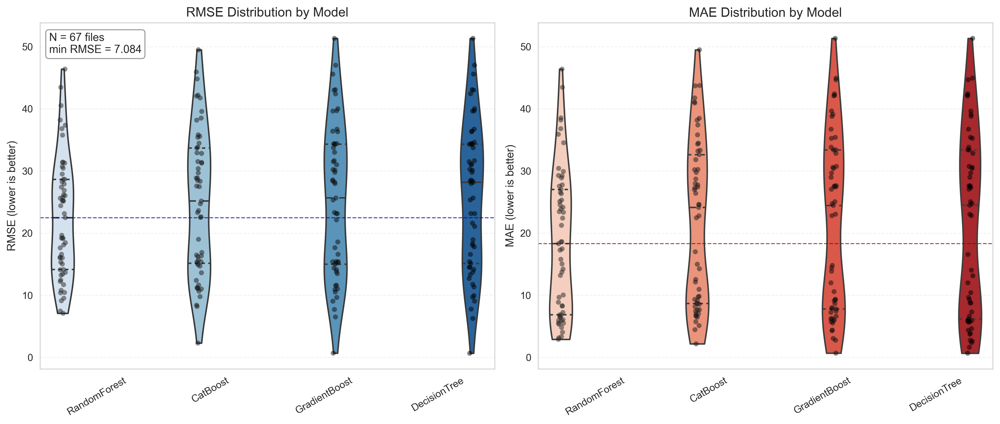

In [16]:
# %% [13] Advanced Error Distribution Analysis
# Select the top models based on performance
top5_models = agg_df.sort_values('Mean CV RMSE').index[:4].tolist()
# top5_models.pop(3) # Pop

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# --- RMSE Distribution Plot ---
# Create a DataFrame for plotting with seaborn
rmse_data = []
for model in top5_models:
    for rmse_val in file_rmse[model]:
        rmse_data.append({'Model': model, 'RMSE': rmse_val})
rmse_df = pd.DataFrame(rmse_data)

# Create violin plot with individual observations
sns.violinplot(x='Model', y='RMSE', hue='Model', data=rmse_df, ax=ax1, 
              palette='Blues', inner='quartile', cut=0, legend=False)
sns.stripplot(x='Model', y='RMSE', data=rmse_df, ax=ax1, hue='Model',
              color='black', alpha=0.5, jitter=True, dodge=True)

# Enhance the plot
ax1.set_title('RMSE Distribution by Model', fontsize=13)
ax1.set_ylabel('RMSE (lower is better)', fontsize=11)
ax1.set_xlabel('')
ax1.tick_params(axis='x', rotation=30)
ax1.grid(True, axis='y', linestyle='--', alpha=0.3)

# --- MAE Distribution Plot ---
# Create a DataFrame for plotting with seaborn
mae_data = []
for model in top5_models:
    for mae_val in file_mae[model]:
        mae_data.append({'Model': model, 'MAE': mae_val})
mae_df = pd.DataFrame(mae_data)

# Create violin plot with individual observations
sns.violinplot(x='Model', y='MAE', hue='Model', data=mae_df, ax=ax2, 
              palette='Reds', inner='quartile', cut=0, legend=False)
sns.stripplot(x='Model', y='MAE', data=mae_df, ax=ax2, hue='Model',
              color='black', alpha=0.5, jitter=True,dodge=True)

# Enhance the plot
ax2.set_title('MAE Distribution by Model', fontsize=13)
ax2.set_ylabel('MAE (lower is better)', fontsize=11)
ax2.set_xlabel('')
ax2.tick_params(axis='x', rotation=30)
ax2.grid(True, axis='y', linestyle='--', alpha=0.3)

# Add a horizontal line for the median of the best model
best_model = top5_models[0]
ax1.axhline(y=np.median(file_rmse[best_model]), color='darkblue', 
            linestyle='--', alpha=0.7, linewidth=1)
ax2.axhline(y=np.median(file_mae[best_model]), color='darkred', 
            linestyle='--', alpha=0.7, linewidth=1)

# Add an annotation with statistics
ax1.text(0.02, 0.97, f'N = {len(files)} files\nmin RMSE = {min(file_rmse[best_model]):.3f}',
         transform=ax1.transAxes, va='top', fontsize=11,
         bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

if ax1.get_legend():
    ax1.get_legend().remove()
if ax2.get_legend():
    ax2.get_legend().remove()

# Improve layout
plt.tight_layout()
plt.savefig("figs_out/advanced_error_distribution.png")
plt.show()

Top-4 models: ['RandomForest', 'CatBoost', 'GradientBoost', 'DecisionTree']


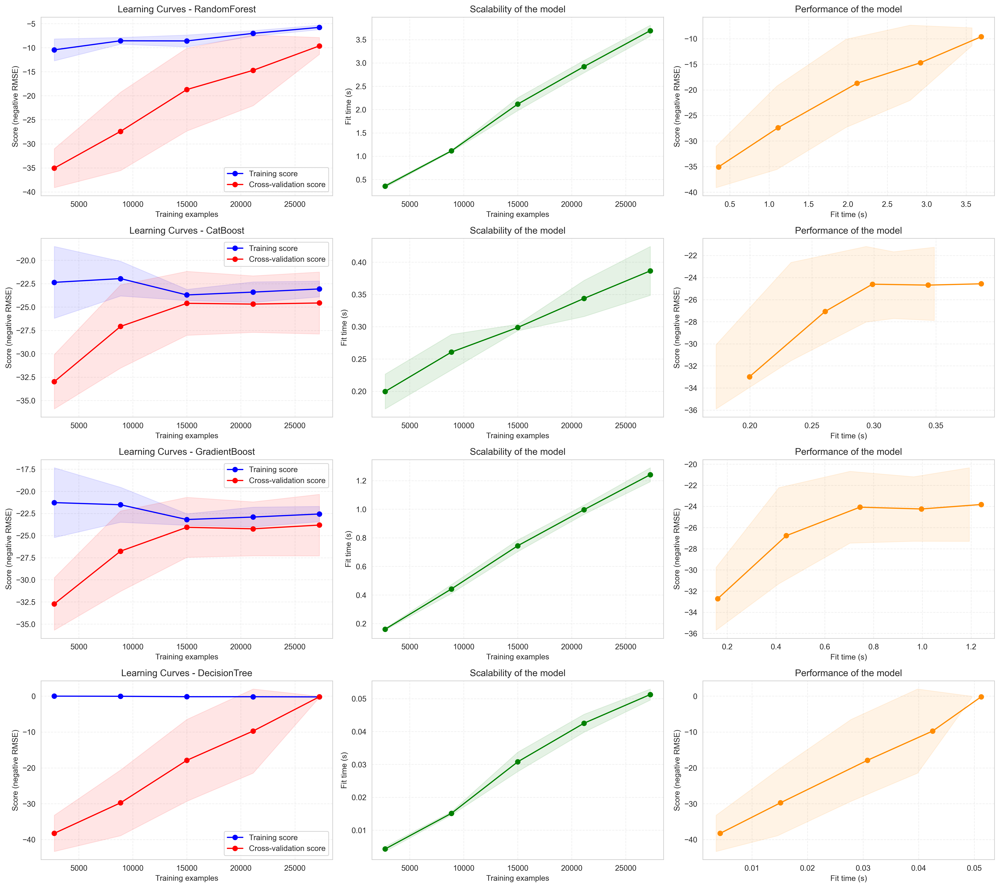

In [17]:
# %% [14] Learning Curves Analysis
from sklearn.model_selection import learning_curve

top8 = agg_df.index[:4].tolist()
print("Top-4 models:", top8)

# Function to plot learning curves
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.
    
    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict`
    title : str
        Title for the chart
    X : array-like of shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.
    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to X for classification or regression.
    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.
    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted.
    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
    train_sizes : array-like of shape (n_ticks,), default=np.linspace(.1, 1.0, 5)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve.
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score (negative RMSE)")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs,
        scoring='neg_root_mean_squared_error',
        train_sizes=train_sizes,
        return_times=True)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="b")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="r")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="b",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="r",
                 label="Cross-validation score")
    axes[0].legend(loc="best")
    axes[0].grid(True, linestyle='--', alpha=0.3)

    # Plot n_samples vs fit_times
    axes[1].set_title("Scalability of the model")
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("Fit time (s)")
    axes[1].plot(train_sizes, fit_times_mean, 'o-', color="g")
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1, color="g")
    axes[1].grid(True, linestyle='--', alpha=0.3)

    # Plot fit_time vs score
    axes[2].set_title("Performance of the model")
    axes[2].set_xlabel("Fit time (s)")
    axes[2].set_ylabel("Score (negative RMSE)")
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-', color="darkorange")
    axes[2].fill_between(fit_times_mean - fit_times_std,
                         test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1, color="darkorange")
    axes[2].grid(True, linestyle='--', alpha=0.3)
    
    return plt

# Create figure with 2 rows for the top 2 models
fig, axes = plt.subplots(len(top8), 3, figsize=(18, 4 * len(top8)))

# Plot learning curves for top 2 models
for i, name in enumerate(top8):
    title = f"Learning Curves - {name}"
    estimator = models[name]
    plot_learning_curve(estimator, title, X_all, y_all, axes=axes[i], cv=5)

plt.tight_layout()
plt.savefig("figs_out/learning_curves.png")
plt.show()

<Figure size 4500x3000 with 0 Axes>

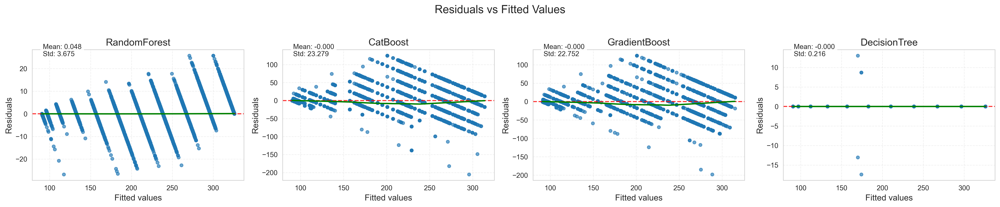

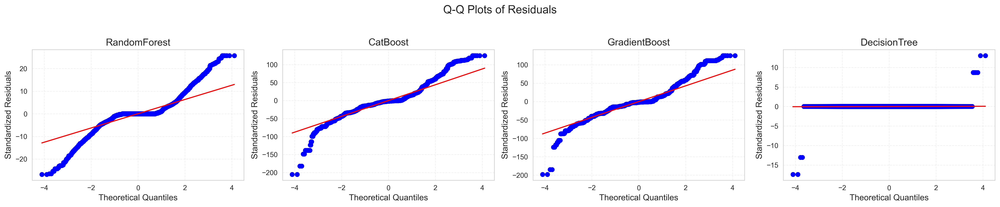

c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

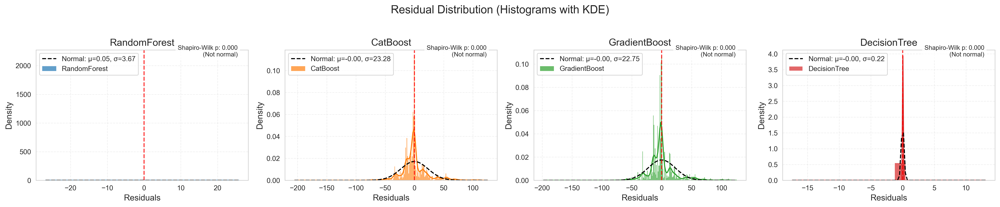

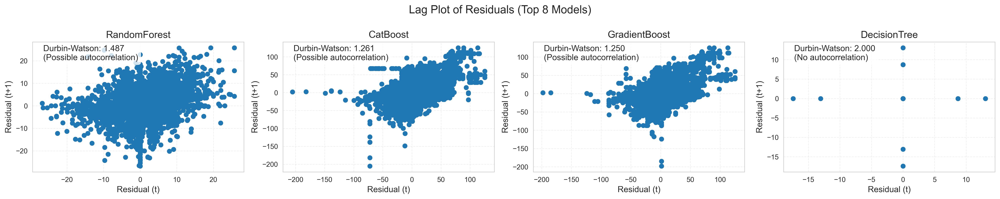

In [19]:
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.stats.stattools import durbin_watson

# %% [15] Comprehensive Residual Analysis
# Create a multi-panel figure for detailed residual analysis
fig = plt.figure(figsize=(15, 10))
fig.suptitle('Comprehensive Residual Analysis', fontsize=16, y=0.98)

# Define gridspec for flexible subplot layout
gs = plt.GridSpec(2, 3, figure=fig, wspace=0.35, hspace=0.3) 

# Calculate residuals for top 2 models
residuals = {}
predictions = {}

for name in top8:
    mdl = models[name].fit(X_all, y_all)
    yhat = mdl.predict(X_all).reshape(-1) if name == "TabNet" else mdl.predict(X_all)
    residuals[name] = y_all - yhat
    predictions[name] = yhat

# --- Residuals vs Fitted Values for all models ---
num_cols = 4 # Number of columns for arranging plots
num_rows = (len(top8) + num_cols - 1) // num_cols # Calculate required rows

fig_res_fitted, axes_res_fitted = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
fig_res_fitted.suptitle('Residuals vs Fitted Values', fontsize=16, y=1.02)
axes_res_fitted = axes_res_fitted.flatten() # Flatten for easy iteration

for i, name in enumerate(top8):
    ax = axes_res_fitted[i]
    # Create scatter plot
    ax.scatter(predictions[name], residuals[name], alpha=0.4, s=20)
    # Add horizontal line at 0
    ax.axhline(y=0, color='red', linestyle='--', alpha=0.8)
    # Add LOWESS trend line to detect patterns
    # Ensure data is sorted for lowess
    sorted_preds = np.sort(predictions[name])
    lowess_y = lowess(residuals[name][np.argsort(predictions[name])], sorted_preds, frac=0.6, return_sorted=True)
    ax.plot(lowess_y[:, 0], lowess_y[:, 1], color='green', lw=2)
    # Labels and title
    ax.set_xlabel('Fitted values', fontsize=12)
    ax.set_ylabel('Residuals', fontsize=12)
    ax.set_title(f'{name}', fontsize=14)
    # Add text with statistics
    resid_mean = np.mean(residuals[name])
    resid_std = np.std(residuals[name])
    ax.text(0.05, 0.95, f'Mean: {resid_mean:.3f}\nStd: {resid_std:.3f}',
            transform=ax.transAxes, fontsize=10,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    # Add grid
    ax.grid(True, linestyle='--', alpha=0.3)

# Remove any unused subplots
for j in range(i + 1, len(axes_res_fitted)):
    fig_res_fitted.delaxes(axes_res_fitted[j])

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("figs_out/residuals_vs_fitted.png", dpi=600)
plt.show()


# --- Q-Q plot to check normality of residuals for all models ---
fig_qq, axes_qq = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
fig_qq.suptitle('Q-Q Plots of Residuals', fontsize=16, y=1.02)
axes_qq = axes_qq.flatten()

for i, name in enumerate(top8):
    ax = axes_qq[i]
    # Create QQ plot
    stats.probplot(residuals[name], dist="norm", plot=ax)
    # Add labels
    ax.set_xlabel('Theoretical Quantiles', fontsize=12)
    ax.set_ylabel('Standardized Residuals', fontsize=12)
    ax.set_title(f'{name}', fontsize=14)
    # Add grid
    ax.grid(True, linestyle='--', alpha=0.3)

for j in range(i + 1, len(axes_qq)):
    fig_qq.delaxes(axes_qq[j])

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("figs_out/qq_plots.png", dpi=600)
plt.show()


# --- Residual histogram with KDE for all models ---
fig_hist, axes_hist = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
fig_hist.suptitle('Residual Distribution (Histograms with KDE)', fontsize=16, y=1.02)
axes_hist = axes_hist.flatten()

for i, name in enumerate(top8):
    ax = axes_hist[i]
    # Plot histogram with kernel density estimate
    sns.histplot(residuals[name], kde=True, ax=ax, stat="density",
                 color=f'C{i % 10}', alpha=0.7, label=name) # Use modulo for color cycling
    # Fit a normal distribution and overlay the PDF
    mu, std = stats.norm.fit(residuals[name])
    x = np.linspace(min(residuals[name]), max(residuals[name]), 100)
    p = stats.norm.pdf(x, mu, std)
    ax.plot(x, p, 'k--', linewidth=1.5, label=f'Normal: μ={mu:.2f}, σ={std:.2f}')
    # Add vertical line at mean=0
    ax.axvline(x=0, color='red', linestyle='--', alpha=0.8)
    # Labels and title
    ax.set_xlabel('Residuals', fontsize=12)
    ax.set_ylabel('Density', fontsize=12)
    ax.set_title(f'{name}', fontsize=14)
    # Add Shapiro-Wilk test for normality
    stat, p_value = stats.shapiro(residuals[name])
    normal_text = "Normal" if p_value > 0.05 else "Not normal"
    ax.text(0.95, 0.95, f'Shapiro-Wilk p: {p_value:.3f}\n({normal_text})',
            transform=ax.transAxes, fontsize=9, ha='right',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    # Add legend
    ax.legend(fontsize=10, loc='upper left')
    # Add grid
    ax.grid(True, linestyle='--', alpha=0.3)

for j in range(i + 1, len(axes_hist)):
    fig_hist.delaxes(axes_hist[j])

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("figs_out/residual_histograms.png", dpi=600)
plt.show()


# --- Autocorrelation plot (lag plot) for the top 8 models ---
fig_lag8, axes_lag8 = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
fig_lag8.suptitle('Lag Plot of Residuals (Top 8 Models)', fontsize=16, y=0.98)
axes_lag8 = axes_lag8.flatten()

for i, name in enumerate(top8):
    ax = axes_lag8[i]
    pd.plotting.lag_plot(pd.Series(residuals[name]), lag=1, ax=ax)
    ax.set_xlabel('Residual (t)', fontsize=12)
    ax.set_ylabel('Residual (t+1)', fontsize=12)
    ax.set_title(f'{name}', fontsize=14)
    dw = durbin_watson(residuals[name])
    autocorr_text = "No autocorrelation" if 1.5 < dw < 2.5 else "Possible autocorrelation"
    ax.text(0.05, 0.86, f'Durbin-Watson: {dw:.3f}\n({autocorr_text})',
            transform=ax.transAxes, fontsize=12,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    ax.grid(True, linestyle='--', alpha=0.3)

for j in range(i + 1, len(axes_lag8)):
    fig_lag8.delaxes(axes_lag8[j])

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("figs_out/autocorrelation_plot_top8.png", dpi=600)
plt.show()


Analyzing 8 top models: ['RandomForest', 'CatBoost', 'GradientBoost', 'DecisionTree', 'NGBoost', 'AdaBoost', 'KNN', 'XGBoost']


c:\Users\plima\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\plima\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


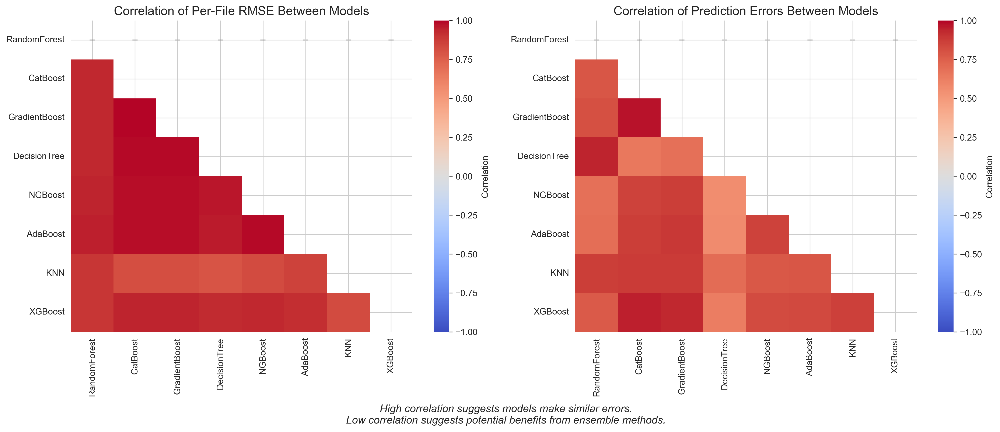

In [ ]:
# %% [16] Error Correlation Between Models
# This plot shows how errors correlate between different models
# which is useful for ensemble consideration

# Select top models for analysis
n_top_models = 8 # Define 'n' explicitly
top_models = agg_df.sort_values('Mean CV RMSE').index[:n_top_models].tolist()

print(f"Analyzing {len(top_models)} top models: {top_models}")

# Create DataFrames for correlation analysis
# These DataFrames will automatically adjust their dimensions based on the number of `top_models`.
df_file_rmse = pd.DataFrame({model: file_rmse[model] for model in top_models})
df_pred_errors = pd.DataFrame()

# Calculate prediction error for each data point for each model
for model in top_models:
    yt = np.array(cv_preds[model]["y_true"])
    yp = np.array(cv_preds[model]["y_pred"])
    df_pred_errors[model] = yp - yt

# Calculate correlation matrices
corr_file_rmse = df_file_rmse.corr()
corr_pred_errors = df_pred_errors.corr()

# Create figure with two subplots for the two correlation heatmaps
# The layout remains 1 row, 2 columns, as we are always showing two distinct heatmaps.
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Create heatmaps
cmap = 'coolwarm'
# Generate an upper triangle mask for the heatmap to avoid redundant information
mask = np.triu(np.ones_like(corr_file_rmse, dtype=bool))

# Per-file RMSE correlation heatmap
# The heatmap automatically scales to the size of the correlation matrix,
# which in turn depends on the number of `top_models`.
sns.heatmap(
    corr_file_rmse, annot=True, fmt='.2f', cmap=cmap,
    mask=mask, vmin=-1, vmax=1, ax=ax1, cbar_kws={'label': 'Correlation'},
    annot_kws={"color": "black"}
)
ax1.set_title('Correlation of Per-File RMSE Between Models', fontsize=14)

# Per-prediction error correlation heatmap
sns.heatmap(
    corr_pred_errors, annot=True, fmt='.2f', cmap=cmap,
    mask=mask, vmin=-1, vmax=1, ax=ax2, cbar_kws={'label': 'Correlation'},
    annot_kws={"color": "black"}
)
ax2.set_title('Correlation of Prediction Errors Between Models', fontsize=14)

# Add interpretation text
plt.figtext(0.5, 0.01,
            "High correlation suggests models make similar errors.\n"
            "Low correlation suggests potential benefits from ensemble methods.",
            ha="center", fontsize=12, fontstyle='italic')

# Improve layout
plt.tight_layout(rect=[0, 0.05, 1, 0.97])
plt.savefig("figs_out/error_correlation_matrix.png")
plt.show()


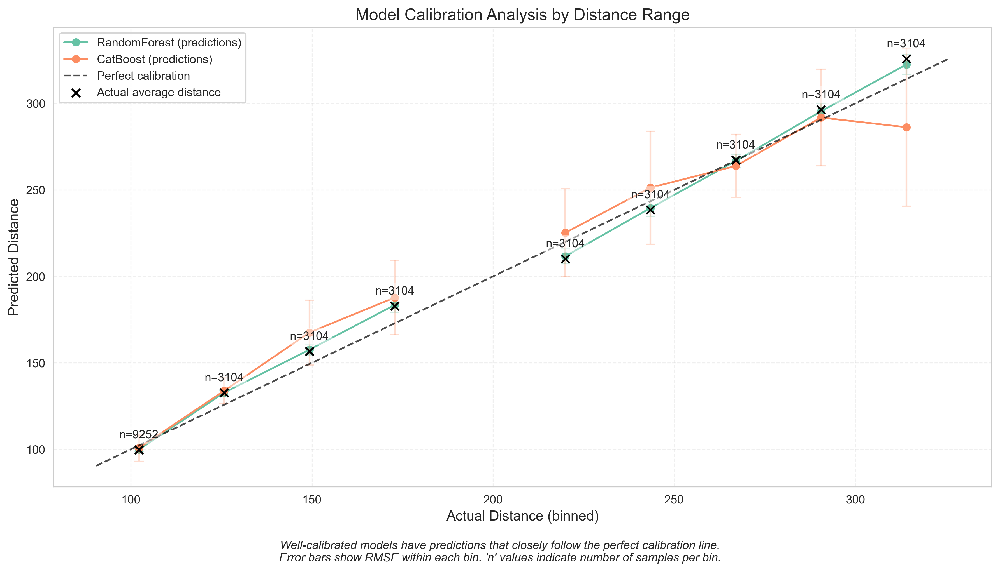

In [ ]:
# %% [17] Model Calibration Analysis
# This visualization assesses how well-calibrated the model predictions are
# across different data ranges

# Select top models for analysis
# The value 'n_top_models' controls how many models are included in the plt.
n_top_models = 2 # Set this to your desired number of top models
top_models = agg_df.sort_values('Mean CV RMSE').index[:n_top_models].tolist()

# Use top_models directly for plotting
plot_models = top_models.copy()

# Dynamically create a color palette based on the number of models
colors = sns.color_palette('Set2', n_colors=len(plot_models))

# Create figure
plt.figure(figsize=(12, 7))

# Create bin info for distance ranges
n_bins = 10
bins = np.linspace(np.min(y_all), np.max(y_all), n_bins + 1)
bin_centers = (bins[:-1] + bins[1:]) / 2
# bin_widths = bins[1:] - bins[:-1] # Not directly used in plotting, but useful for context

# For each model
for i, name in enumerate(plot_models):
    # Get predictions
    mdl = models[name].fit(X_all, y_all)
    # Ensure yhat is 1D for consistent calculations
    yhat = mdl.predict(X_all).reshape(-1)

    # Calculate mean predictions and actual values per bin
    mean_pred = []
    mean_true = []
    rmse_per_bin = []
    counts = []

    # For each bin, calculate metrics
    for bin_idx in range(n_bins):
        # Define bin boundaries (inclusive lower, exclusive upper for all but the last bin)
        if bin_idx == n_bins - 1: # Last bin is inclusive of upper bound
            bin_mask = (y_all >= bins[bin_idx]) & (y_all <= bins[bin_idx + 1])
        else:
            bin_mask = (y_all >= bins[bin_idx]) & (y_all < bins[bin_idx + 1])

        if np.sum(bin_mask) > 0:
            mean_pred.append(np.mean(yhat[bin_mask]))
            mean_true.append(np.mean(y_all[bin_mask]))
            # Calculate RMSE only if there are enough samples for meaningful calculation
            if len(y_all[bin_mask]) > 1:
                rmse_per_bin.append(np.sqrt(mean_squared_error(y_all[bin_mask], yhat[bin_mask])))
            else:
                rmse_per_bin.append(np.nan) # Cannot calculate RMSE with one or zero samples
            counts.append(np.sum(bin_mask))
        else:
            mean_pred.append(np.nan)
            mean_true.append(np.nan)
            rmse_per_bin.append(np.nan)
            counts.append(0)

    # Plot calibration curve
    plt.plot(bin_centers, mean_pred, marker='o', linestyle='-', color=colors[i],
             label=f'{name} (predictions)')

    # Optional: add error bars showing RMSE, ensuring only non-NaN RMSEs are plotted
    plt.errorbar(bin_centers, mean_pred,
                 yerr=np.array(rmse_per_bin), # Pass as numpy array to handle NaNs
                 fmt='none',
                 ecolor=colors[i], alpha=0.3, capsize=4)


# Plot perfect calibration line
plt.plot(bins, bins, 'k--', label='Perfect calibration', alpha=0.7)

# Plot the true mean values per bin for reference
# Filter out NaN values from bin_centers and mean_true for scatter plot
valid_bin_centers = [bc for bc, mt in zip(bin_centers, mean_true) if not np.isnan(mt)]
valid_mean_true = [mt for mt in mean_true if not np.isnan(mt)]

plt.scatter(valid_bin_centers, valid_mean_true, color='black', s=50, marker='x',
            label='Actual average distance', zorder=10)

# Annotate with bin sample counts
for i, (x, y, count) in enumerate(zip(bin_centers, mean_true, counts)):
    if not np.isnan(y) and count > 0: # Only annotate if there are samples in the bin
        plt.annotate(f'n={count}', (x, y), textcoords="offset points",
                     xytext=(0,10), ha='center', fontsize=10, # Reduced font size for better fit
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor='none', facecolor='white', alpha=0.5))

# Enhance the plot
plt.xlabel('Actual Distance (binned)', fontsize=12)
plt.ylabel('Predicted Distance', fontsize=12)
plt.title('Model Calibration Analysis by Distance Range', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(loc='best', fontsize=10) # Reduced legend font size

# Add explanation
plt.figtext(0.5, 0.01,
            "Well-calibrated models have predictions that closely follow the perfect calibration line.\n"
            "Error bars show RMSE within each bin. 'n' values indicate number of samples per bin.",
            ha="center", fontsize=10, fontstyle='italic', wrap=True) # Added wrap=True for long text

# Improve layout
plt.tight_layout(rect=[0, 0.05, 1, 0.97])
plt.savefig("figs_out/model_calibration_analysis.png", dpi=300)  # Save with high DPI
plt.show()


# Apply RandomForest for csvs

In [446]:
CSVs = glob.glob("csvs/*.csv")
CSVs = CSVs[1:]

print(len(CSVs), "CSV files found:", CSVs)

66 CSV files found: ['csvs\\10-10-2024_05-18-48_track_240_cam_0_tracking_2_processado.avi.csv', 'csvs\\10-10-2024_05-18-48_track_240_cam_0_tracking_3_processado.avi.csv', 'csvs\\10-10-2024_05-18-48_track_240_cam_0_tracking_4_processado.avi.csv', 'csvs\\10-10-2024_05-19-41_track_241_cam_0_tracking_5_processado.avi.csv', 'csvs\\10-10-2024_05-19-41_track_241_cam_0_tracking_6_processado.avi.csv', 'csvs\\10-10-2024_06-35-04_track_243_cam_0_tracking_7_processado.avi.csv', 'csvs\\10-10-2024_07-14-32_track_248_cam_0_tracking_8_processado.avi.csv', 'csvs\\10-10-2024_07-50-59_track_251_cam_0_tracking_9_processado.avi.csv', 'csvs\\10-10-2024_08-31-27_track_262_cam_0_tracking_10_processado.avi.csv', 'csvs\\10-10-2024_08-57-19_track_273_cam_0_tracking_11_processado.avi.csv', 'csvs\\10-10-2024_08-57-19_track_273_cam_0_tracking_12_processado.avi.csv', 'csvs\\10-10-2024_08-57-19_track_273_cam_0_tracking_13_processado.avi.csv', 'csvs\\10-10-2024_08-58-04_track_274_cam_0_tracking_14_processado.avi.csv',

In [414]:
def new_track_id(track_id):
    track_id_str = str(track_id)
    m = re.match(r"^(.*)_(\d+)$", track_id_str)
    if m:
        base, num = m.groups()
        track_id = f"{base}_{int(num)+1}"
    else:
        track_id = f"{track_id_str}_1"
    return track_id

new_track_id('1.0_1')

'1.0_2'

In [415]:
IGNORE = True

bird_flight = {}
for CSV in CSVs:
    data = pd.read_csv(CSV)
    for track_id in data['track_id'].unique():
        track_data = data[data['track_id'] == track_id]
        if IGNORE:
            track_data = track_data[track_data['ignore'] == 0]
        if len(track_data) == 0:
            print(f"Skipping {CSV} track_id {track_id} due to no valid data")
            continue
        track_data['inv_depth'] = 1 / track_data['bird_Depth']
        track_data = track_data[track_data['inv_depth']!= np.inf]
        if len(track_data) == 0:
            print(f"Skipping {CSV} track_id {track_id} due to no valid data due to infinity inv_depth")
            continue
               

        inv_depths = []
        distances = []
        current_frames = []
        inv_depth_in_range = []
        for i, row in track_data.iterrows():
            ref_depth_values = extract_nums(row['ref_depth_values'])
            inv_depth = 1 / ref_depth_values
            ref_distance_values = extract_nums(row['ref_distance_values'])
            models['RandomForest'].fit(inv_depth.reshape(-1,1),  ref_distance_values)
            
            inv_depths.append(row['inv_depth'])
            current_frames.append(row['current_frame'])

            dist = models['RandomForest'].predict( np.array(row['inv_depth']).reshape(-1, 1) )
            distances.append(dist)

            inv_depth_in_range.append(row['inv_depth'] < max(inv_depth) )
        while track_id in bird_flight:
            track_id = new_track_id(track_id)
            print(f"Duplicate track_id {track_id} found, renaming to {track_id}")
        bird_flight[track_id] = [current_frames, distances, inv_depths,inv_depth_in_range]

Skipping csvs\10-10-2024_05-18-48_track_240_cam_0_tracking_2_processado.avi.csv track_id 1.0 due to no valid data
Skipping csvs\10-10-2024_05-18-48_track_240_cam_0_tracking_3_processado.avi.csv track_id 2.0 due to no valid data
Skipping csvs\10-10-2024_05-18-48_track_240_cam_0_tracking_4_processado.avi.csv track_id 2.0 due to no valid data
Skipping csvs\10-10-2024_05-19-41_track_241_cam_0_tracking_5_processado.avi.csv track_id 1.0 due to no valid data
Skipping csvs\10-10-2024_05-19-41_track_241_cam_0_tracking_6_processado.avi.csv track_id 2.0 due to no valid data
Duplicate track_id 1.0_1 found, renaming to 1.0_1
Duplicate track_id 1.0_1 found, renaming to 1.0_1
Duplicate track_id 1.0_2 found, renaming to 1.0_2
Duplicate track_id 1.0_1 found, renaming to 1.0_1
Duplicate track_id 1.0_2 found, renaming to 1.0_2
Duplicate track_id 1.0_3 found, renaming to 1.0_3
Skipping csvs\10-10-2024_08-57-19_track_273_cam_0_tracking_12_processado.avi.csv track_id 17.0 due to no valid data
Skipping csvs\

In [450]:
num_frames_per_flight = [len(bird_flight[bf][0]) for bf in bird_flight]
# plt.figure(figsize=(3, 3))
# plt.hist(num_frames_per_flight,bins=40)
# plt.tight_layout()
# plt.show()
print(f"valid flights: {bird_flight.__len__()}, but {sum(np.array(num_frames_per_flight)>2)} have more than 2 frames")


valid flights: 76, but 37 have more than 2 frames


In [417]:
for bf in bird_flight:
    bird_flight[bf][0] = np.array(bird_flight[bf][0]).flatten()
    bird_flight[bf][1] = np.array(bird_flight[bf][1]).flatten()
    bird_flight[bf][2] = np.array(bird_flight[bf][2]).flatten()
    bird_flight[bf][3] = np.array(bird_flight[bf][3]).flatten()

In [418]:
INV_DEPTH_MULTIPLEIR = 20

if False:
    for bf in bird_flight:
        if len(bird_flight[bf][0])  > 10:
            plt.figure(figsize=(5, 3))
            plt.plot(bird_flight[bf][0]*1/15, bird_flight[bf][1], '*',label='Predicted Distance')
            plt.plot(bird_flight[bf][0]*1/15, bird_flight[bf][2]*INV_DEPTH_MULTIPLEIR, '*',label=f'Inverse Depth ({INV_DEPTH_MULTIPLEIR}X)')
            plt.plot(bird_flight[bf][0]*1/15, bird_flight[bf][3]*100, '-',label=f'Is bird in reference range? (True/False)')
            plt.xlabel('Time (s)')
            plt.ylabel('Predicted Distance (m)')
            plt.title(f'Flight Track {bf}')
            plt.ylim(0, 500)
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.savefig(f"figs_out/flight_track_{bf}.png", dpi=300)
            plt.show()


## Filter / Time Integration

In [419]:
def filter(array, n = 3):
    out = []
    half_n  = (n-1)/2
    len(array) - n
    for i in range(len(array) - n + 1):
        out.append(np.mean(array[i:i+n]))
    return np.array(out)

import numpy as np

def fit_polynomial(X, Y, d=3):
    """
    Fits a 3rd degree polynomial to the data (X, Y).

    Parameters:
    X (array-like): Input feature values.
    Y (array-like): Target values.

    Returns:
    numpy.poly1d: A polynomial object representing the best-fit 3rd degree polynomial.
    """
    # Fit a 3rd degree polynomial
    coeffs = np.polyfit(X, Y, d)
    # print(coeffs.flatten(), coeffs[0])

    # Create a polynomial object
    polynomial = np.poly1d(coeffs.flatten())

    return polynomial

def generate_polynomial_curve(polynomial, X_min, X_max, N=100):
    """
    Generate X and Y values from a polynomial function.

    Parameters:
    - polynomial: numpy.poly1d, the fitted polynomial function
    - X_max: float, the maximum value of X
    - N: int, number of points to generate (default 100)

    Returns:
    - X: numpy.ndarray, shape (N,), values from 0 to X_max
    - Y: numpy.ndarray, shape (N,), polynomial evaluated at X
    """
    X = np.linspace(X_min, X_max, N)
    Y = polynomial(X)
    return X, Y


In [420]:
from itertools import compress

for bf in bird_flight:
    bird_flight[bf][3] = np.array(bird_flight[bf][3]).flatten()

INV_DEPTH_MULTIPLEIR = 20

bird_flight_fii = {}
for bf in bird_flight:
    bird_flight_fii[bf] = [
        np.array(list(compress(bird_flight[bf][0], bird_flight[bf][3]))),
        np.array(list(compress(bird_flight[bf][1], bird_flight[bf][3]))),
        np.array(list(compress(bird_flight[bf][2], bird_flight[bf][3])))
    ]

bird_flight_fii[1]
num_frames_per_flight = [len(bird_flight_fii[bf][0]) for bf in bird_flight_fii]
print(f"valid flights: {bird_flight_fii.__len__()}, but {sum(np.array(num_frames_per_flight)>5)} have more than 5 frames")


valid flights: 76, but 18 have more than 5 frames


57.76448406390034


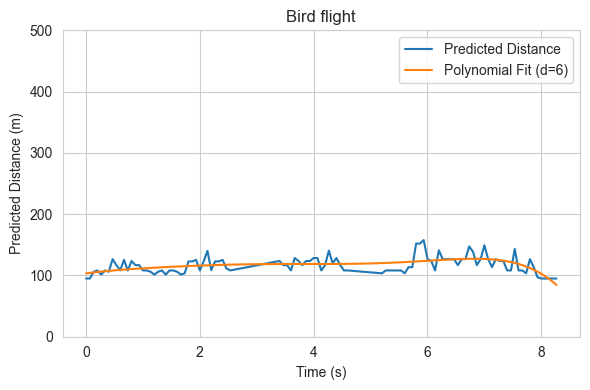

177.54592246820033
60.40205491876176


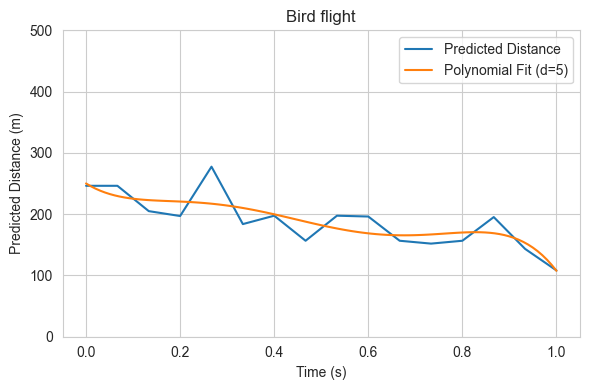

163.53406755350005
39.63036269599809


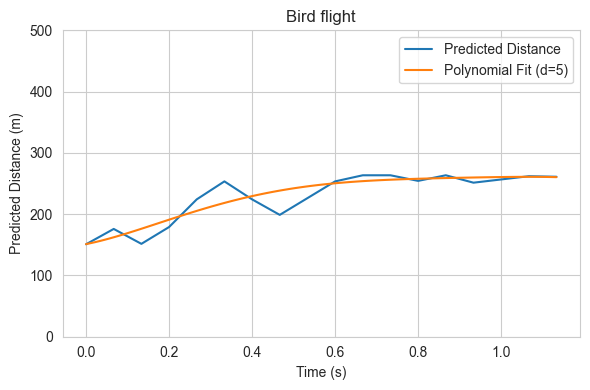

208.56938885540052
33.49502852532618
34.50400838949321
35.146188434959925


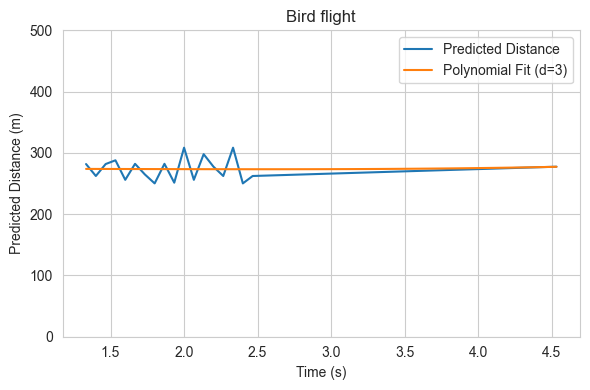

20.326910380600154


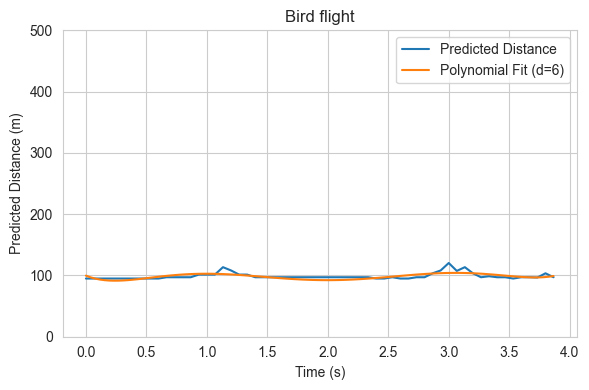

208.87410831840066
1.869434470336273e-06


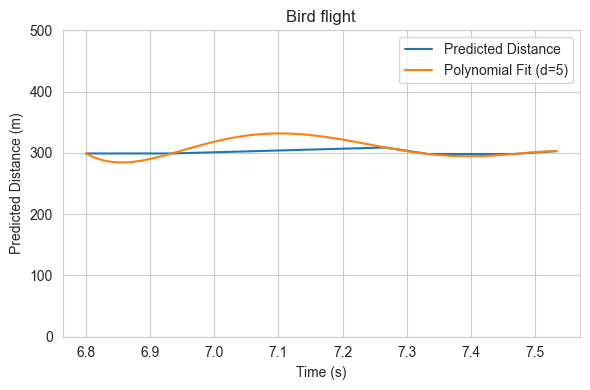

196.7327111739005
11.845656730541123


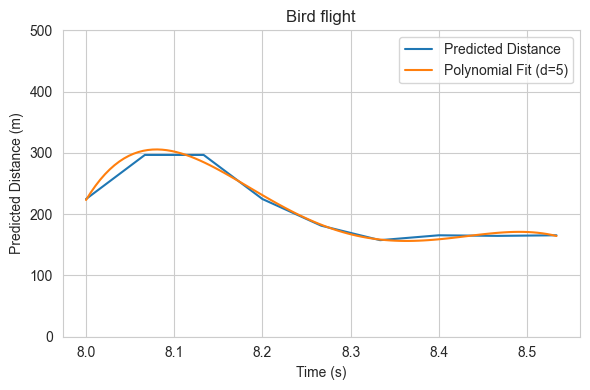

203.88607583660047
26.988402525156573
25.847011200604186
45.96962284087709


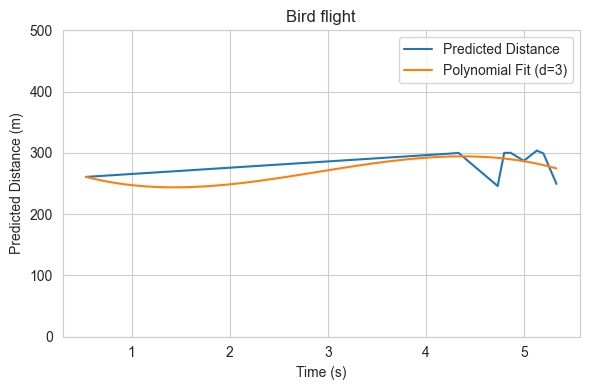

209.72081232060054
10.029142310052293


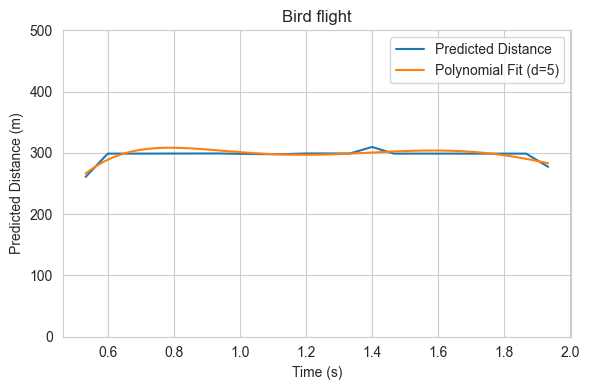

208.56938885540052
54.45477247772834


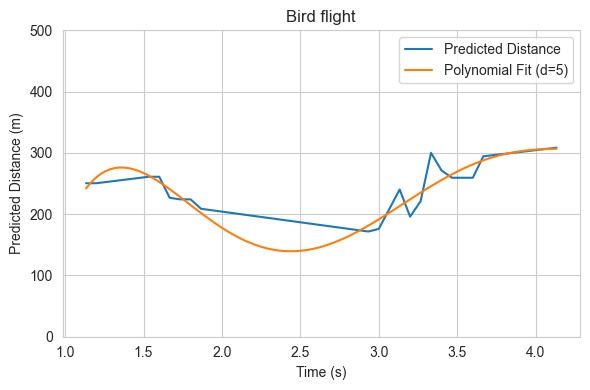

209.72081232060054
26.914473439833586


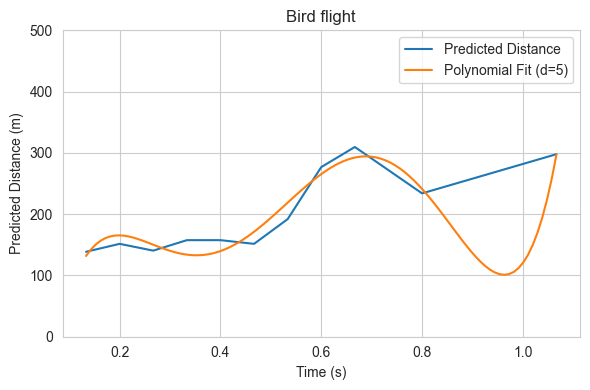

156.63750036250002
31.872994386673838
43.04085779364078


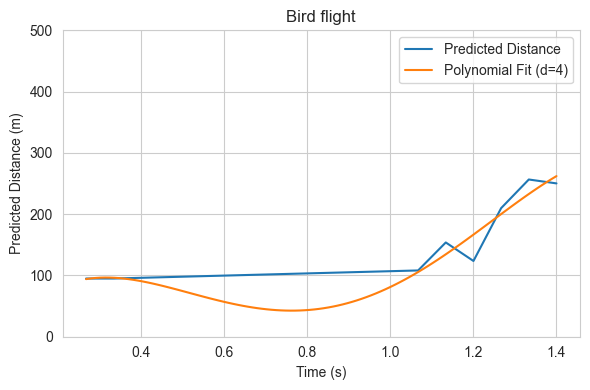

124.21528295500022
38.79550056943603


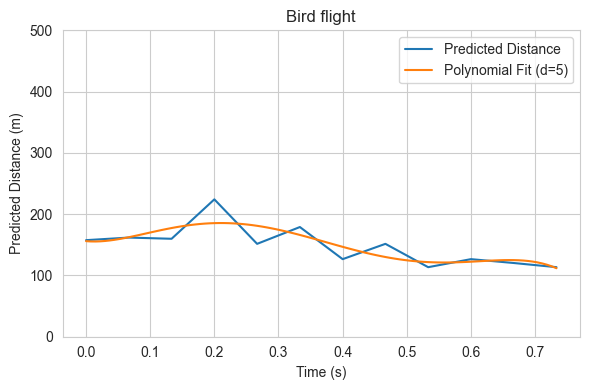

208.56938885540052
88.55619422906358


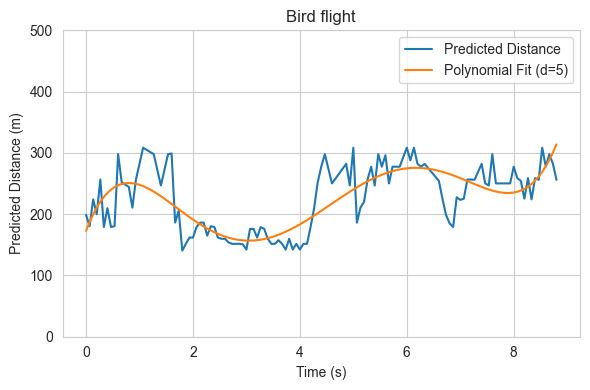

208.56938885540052
140.49479837106895
141.08749240743686
147.76737704519786
162.95538900781173


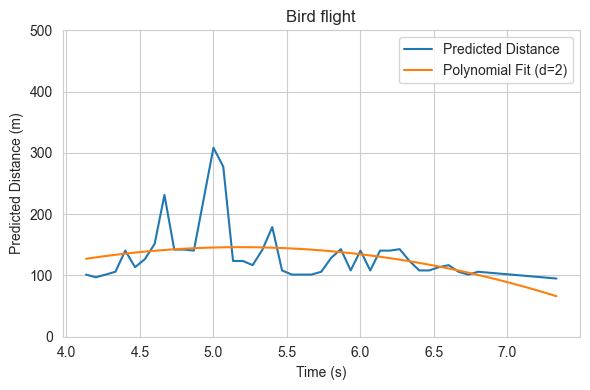

209.72081232060054
89.7868535069646


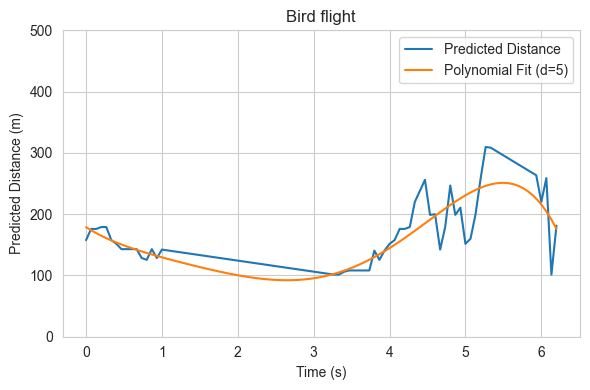

147.11341318739986
25.394587762594583
25.222163453638913
89.73533467493078


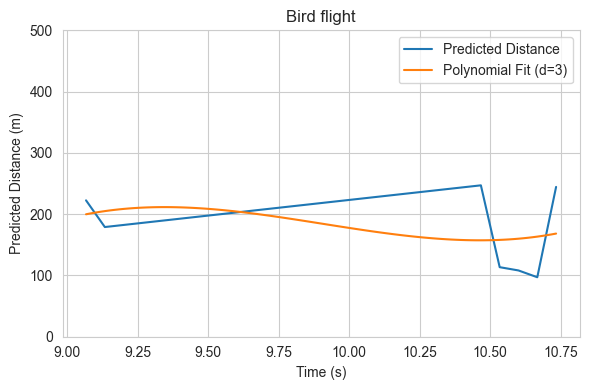

209.72081232060054
27.637768725173828


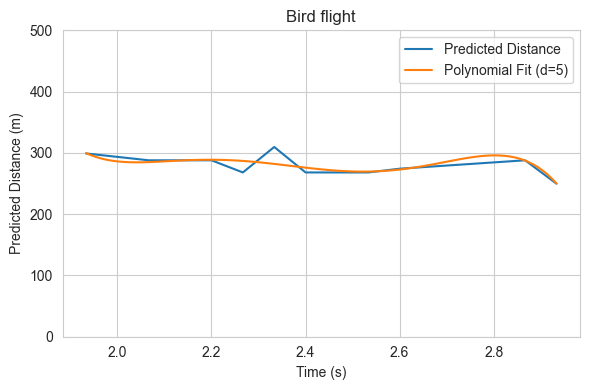

In [421]:
INV_DEPTH_MULTIPLEIR = 20
n = 5
dimension = 5
for bf in bird_flight_fii:
    if len(bird_flight_fii[bf][0])  > 5:
        d = dimension + 1
        plt.figure(figsize=(6, 4), dpi=100)  # Adjust dpi to a lower value like 72
        plt.plot(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1],label='Predicted Distance')
        # plt.plot(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][2]*INV_DEPTH_MULTIPLEIR, '*',label=f'Inverse Depth ({INV_DEPTH_MULTIPLEIR}X)')
        filtered_distance = filter(bird_flight_fii[bf][1], n=n)
        # plt.plot(bird_flight_fii[bf][0][2:-2]*1/15, filtered_distance, ':',label='Filtered Distance')

        Y_check = np.ones(len(bird_flight_fii[bf][1]))*100
        
        polynomial = fit_polynomial(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], d=d)
        X,Y = generate_polynomial_curve(
            polynomial, X_min = bird_flight_fii[bf][0].min()*1/15,  X_max=bird_flight_fii[bf][0].max()*1/15, N=100)

        while np.max(abs(bird_flight_fii[bf][1] - Y_check )) > 100 or \
                abs(np.min(bird_flight_fii[bf][1]) - np.min(Y)) > 200  \
                    or abs(np.max(bird_flight_fii[bf][1]) - np.max(Y)) > 100:
            print(np.max(abs(bird_flight_fii[bf][1] - Y_check )))
            d -= 1
            polynomial = fit_polynomial(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], d=d)
            X,Y = generate_polynomial_curve(
                polynomial, X_min = bird_flight_fii[bf][0].min()*1/15,  X_max=bird_flight_fii[bf][0].max()*1/15, N=100)
            Y_check = polynomial(bird_flight_fii[bf][0]*1/15)
            if d ==2:
                break
        bird_flight_fii[bf].append((X,Y))
        print(np.max(abs(bird_flight_fii[bf][1] - Y_check )))
        # plt.figure(figsize=(5, 3))
        plt.plot(X, Y, '-',label=f'Polynomial Fit (d={d})')
        plt.xlabel('Time (s)')
        plt.ylabel('Predicted Distance (m)')
        plt.title(f'Bird flight')
        plt.ylim(0, 500)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        # plt.savefig(f"figs_out/flight_track_{bf}.png", dpi=300)
        plt.show()

        # break


# Gaussian filters

In [422]:
model_name = 'RandomForest'
resid_std = np.std(residuals[model_name])
resid_std, resid_std**2

(3.6749555783507137, 13.505298502851028)

In [423]:
import GPy # $ pip install --upgrade GPy
model_name = 'RandomForest'
resid_std = np.std(residuals[model_name])

# confidence = 22 #m # 95% Interval
# predicted_noise = (2*confidence) / (2*1.96) # 95% confidence interval, so 2*1.96 for two-tailed

predicted_noise = resid_std
print(f"Predicted noise std {predicted_noise:.2f} m")
print(f"Predicted noise variance {predicted_noise**2:.2f} m")

priorLengthscale = GPy.priors.LogGaussian(mu=2, sigma=1)
priorLengthscale = GPy.priors.Gamma(a=25, b=.1)
priotVariance    = GPy.priors.Gamma(a=20, b=.01)
priotVariance    = GPy.priors.Gamma(a=20, b=.01)


def GaussianReg(X_train, Y_train, noise=predicted_noise, variance=1.0, lengthscale=4.0):
       # Define the kernel and model
    if len(X_train.shape) == 1:
        X_train = X_train.reshape(-1, 1)
    if len(Y_train.shape) == 1:
        Y_train = Y_train.reshape(-1, 1)

    kernel = GPy.kern.RBF(input_dim=X_train.shape[1], variance=variance, lengthscale=lengthscale)
    # kernel = GPy.kern.Matern52(input_dim=X_train.shape[1], variance=variance, lengthscale=lengthscale)

    # kernel.lengthscale.set_prior(priorLengthscale)
    kernel.lengthscale.fix()
    # kernel.variance.set_prior(priotVariance)
    gpr = GPy.models.GPRegression(X_train, Y_train, kernel)

    # Fix the noise variance to known value 
    gpr.Gaussian_noise.variance = noise**2
    gpr.Gaussian_noise.variance.fix()

    # Run optimization
    gpr.optimize(clear_after_finish=True,messages=False)

    return gpr
# Display optimized parameter values
# display(gpr)
# gpr = GaussianReg(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1])



def GaussenRegStudentT(X_train, Y_train, noise=predicted_noise):
    if len(X_train.shape) == 1:
        X_train = X_train.reshape(-1, 1)
    if len(Y_train.shape) == 1:
        Y_train = Y_train.reshape(-1, 1)

    #    Let's use a Student-T distribution.
    #    We need to provide initial values for its parameters (e.g., degrees_freedom, sigma2).
    student_t_likelihood = GPy.likelihoods.StudentT(deg_free=50, sigma2=noise**2)
    student_t_likelihood.sigma2.fix()

    
    laplace_inf = GPy.inference.latent_function_inference.Laplace()

    kernel = GPy.kern.RBF(input_dim=1)
    
    kernel.lengthscale.set_prior(priorLengthscale)
    kernel.variance.set_prior(GPy.priors.Gamma(a=20, b=.01))

    laplace_gp = GPy.core.GP(
        X=X_train,
        Y=Y_train,
        kernel=kernel,
        likelihood=student_t_likelihood,
        inference_method=laplace_inf
    )

    # 6. Optimize the model
    laplace_gp.optimize(clear_after_finish=True,messages=False)
    # print(laplace_gp)
    return laplace_gp

Predicted noise std 3.67 m
Predicted noise variance 13.51 m


In [424]:
gpr = GaussenRegStudentT(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], 
                            noise=predicted_noise)


reconstraining parameters rbf.lengthscale
reconstraining parameters rbf.variance


### Priors plot

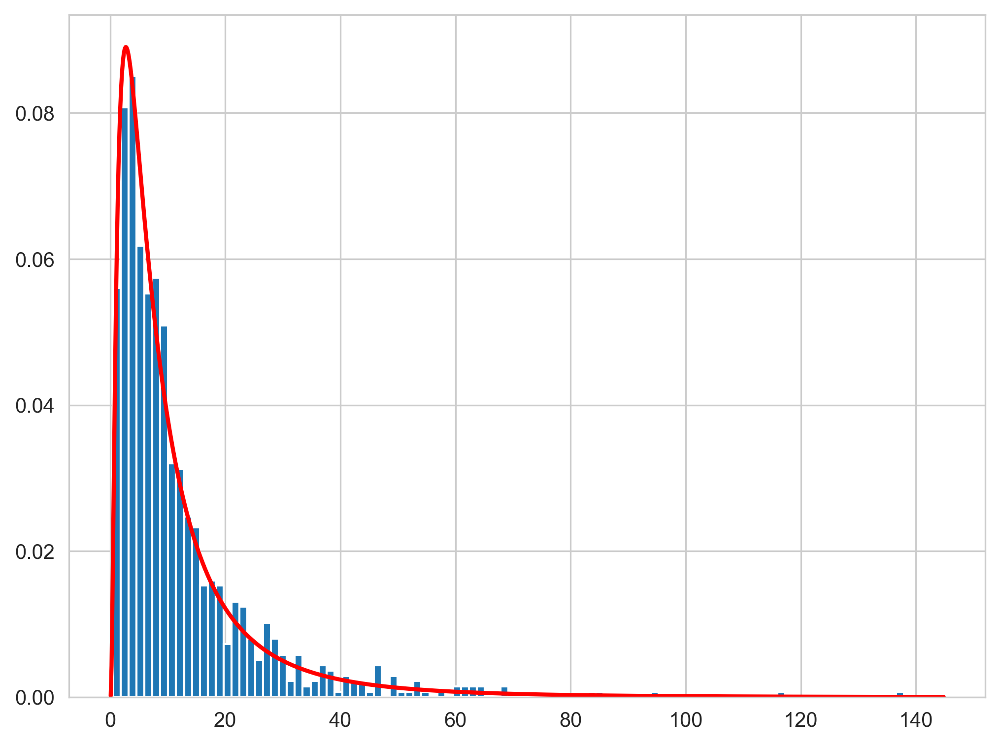

In [425]:
GPy.priors.LogGaussian(mu=2, sigma=1).plot()

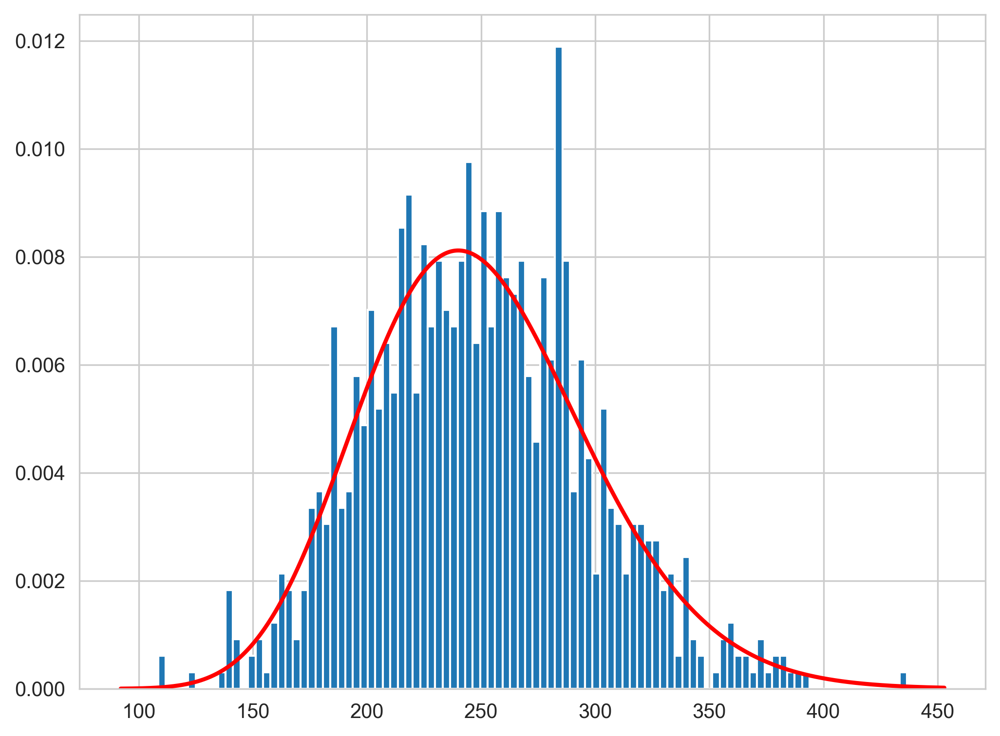

In [426]:
GPy.priors.Gamma(a=25, b=.1).plot()

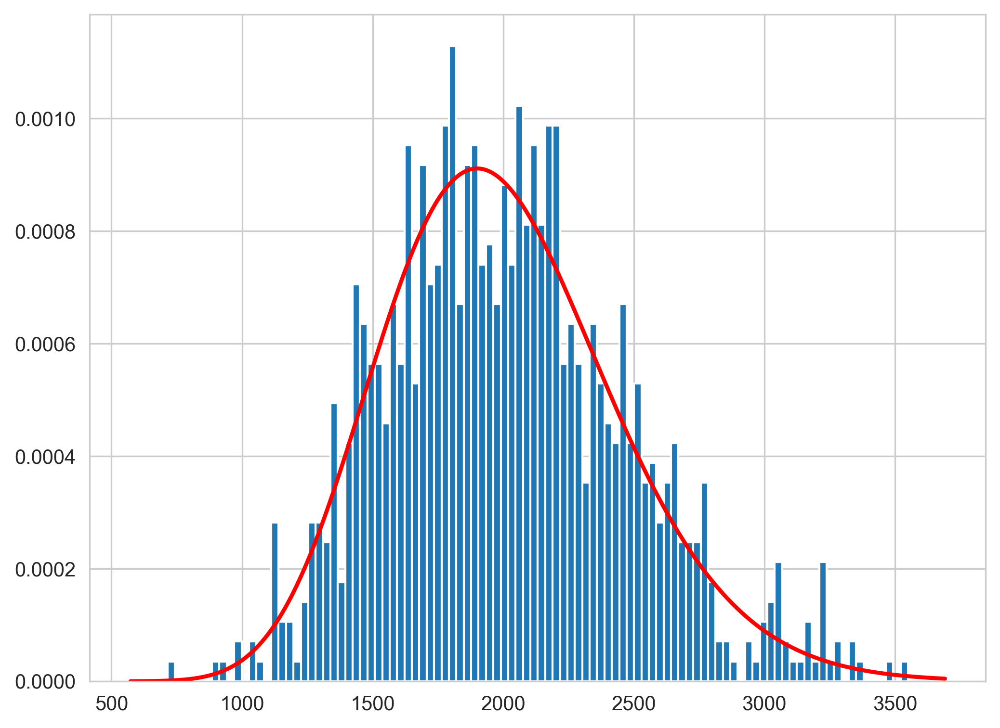

In [427]:
GPy.priors.Gamma(a=20, b=.01).plot()

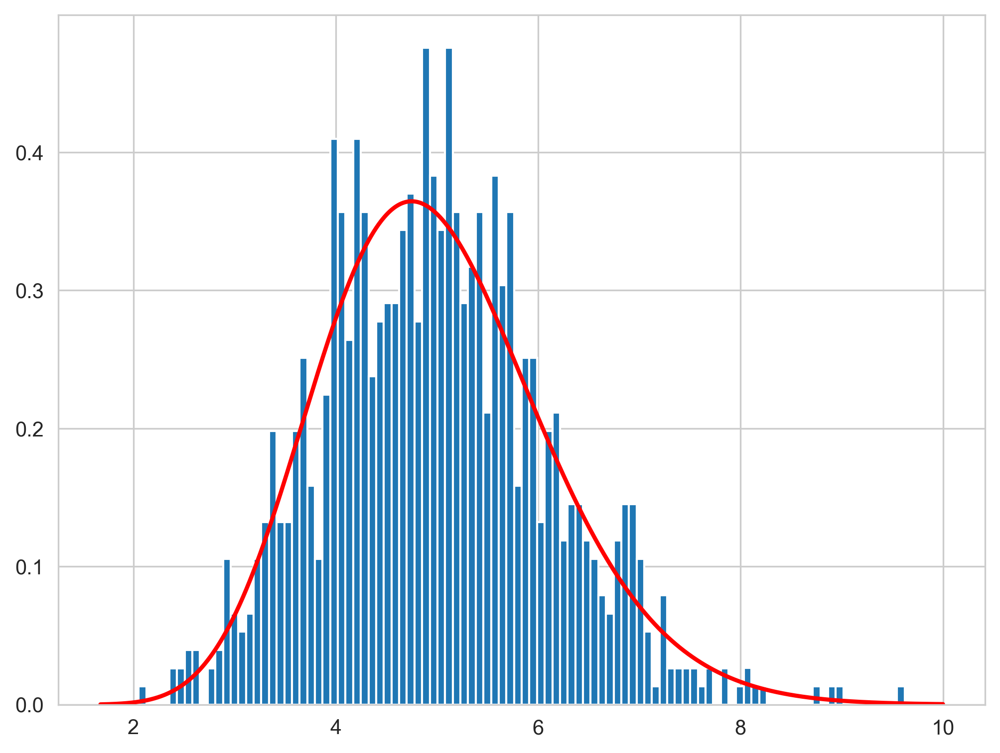

In [428]:
GPy.priors.Gamma(a=20, b=4).plot()


### Apply the Gaussian and student T regressor

In [429]:
tracks_id_article = ['1.0_2', 2.0, 4.0, 43, 101.0,'1.0_20','3.0_2','7.0']

Flight 1.0_1 Gaussian Regression Avg CI: 7.51 m, Max CI: 8.28 m, Min CI: 7.40 m
Flight 1.0_1 Gaussian Regression Avg CI of mean: 15.01 m, Max CI of mean: 16.56 m, Min CI of mean: 14.80 m


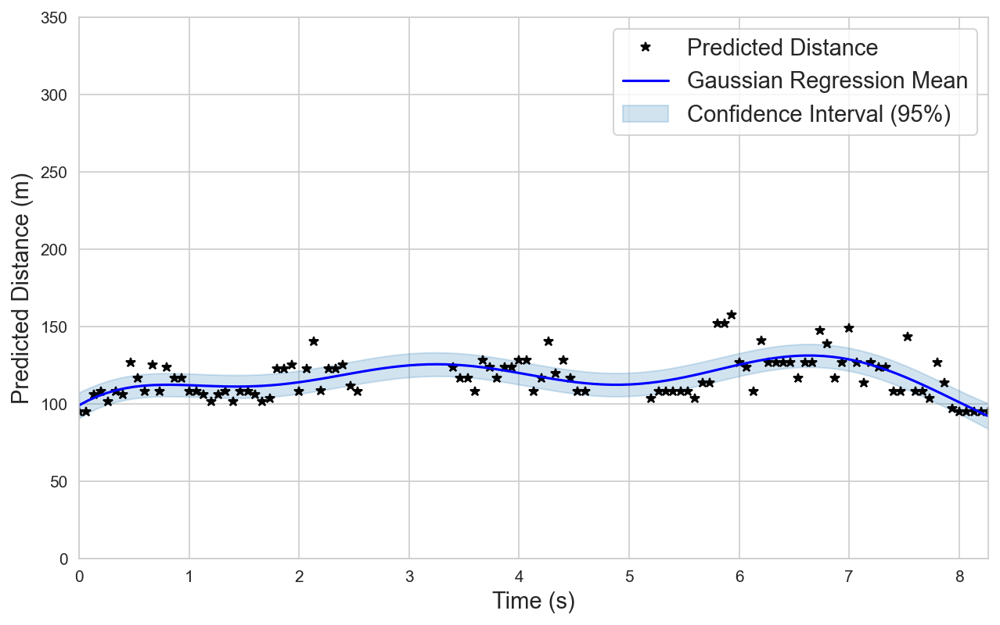

Flight 1.0_2 Gaussian Regression Avg CI: 7.79 m, Max CI: 8.62 m, Min CI: 7.62 m
Flight 1.0_2 Gaussian Regression Avg CI of mean: 15.58 m, Max CI of mean: 17.24 m, Min CI of mean: 15.23 m


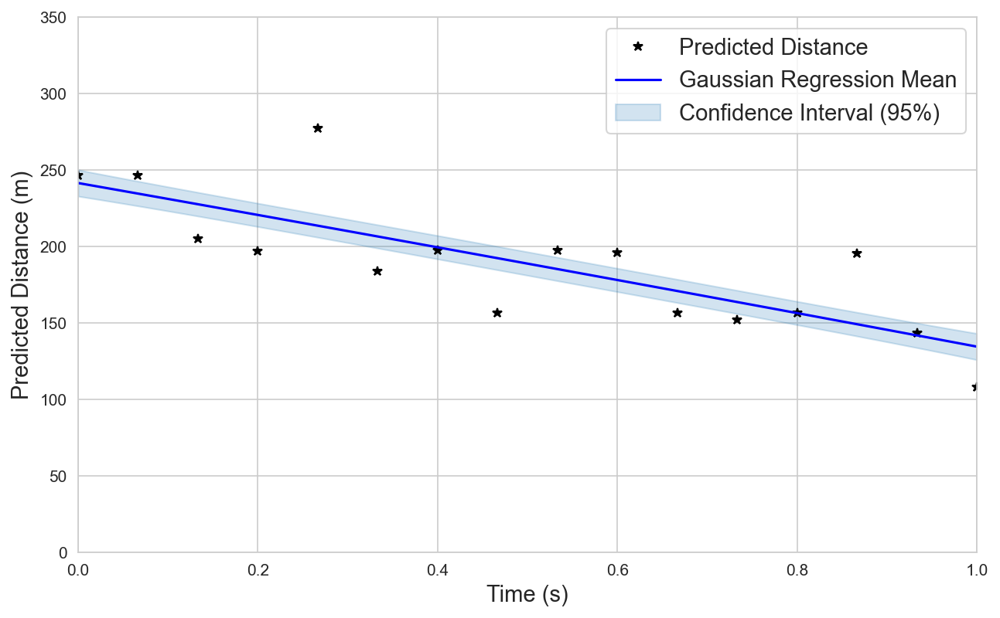

Flight 2.0 Gaussian Regression Avg CI: 7.83 m, Max CI: 8.86 m, Min CI: 7.66 m
Flight 2.0 Gaussian Regression Avg CI of mean: 15.67 m, Max CI of mean: 17.72 m, Min CI of mean: 15.32 m


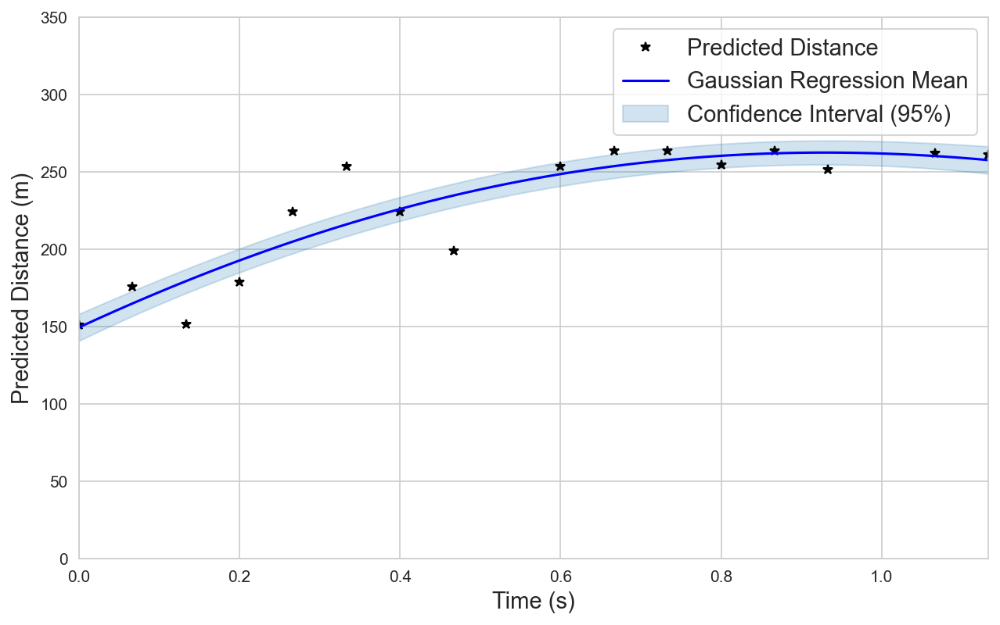

Flight 4.0 Gaussian Regression Avg CI: 14.97 m, Max CI: 27.08 m, Min CI: 7.56 m
Flight 4.0 Gaussian Regression Avg CI of mean: 29.94 m, Max CI of mean: 54.16 m, Min CI of mean: 15.12 m


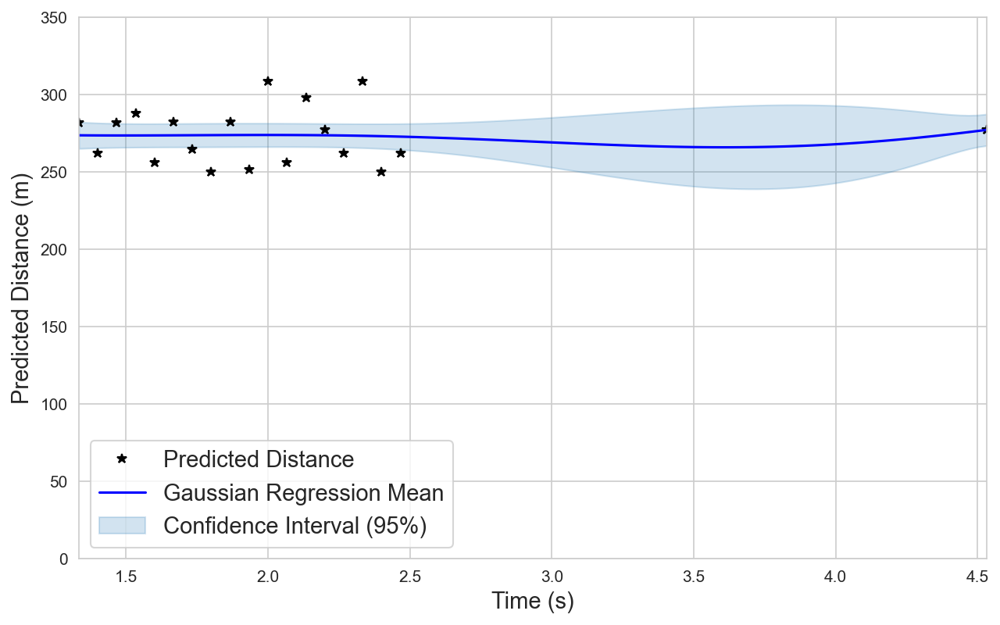

Flight 1.0_4 Gaussian Regression Avg CI: 7.58 m, Max CI: 8.17 m, Min CI: 7.45 m
Flight 1.0_4 Gaussian Regression Avg CI of mean: 15.15 m, Max CI of mean: 16.34 m, Min CI of mean: 14.90 m


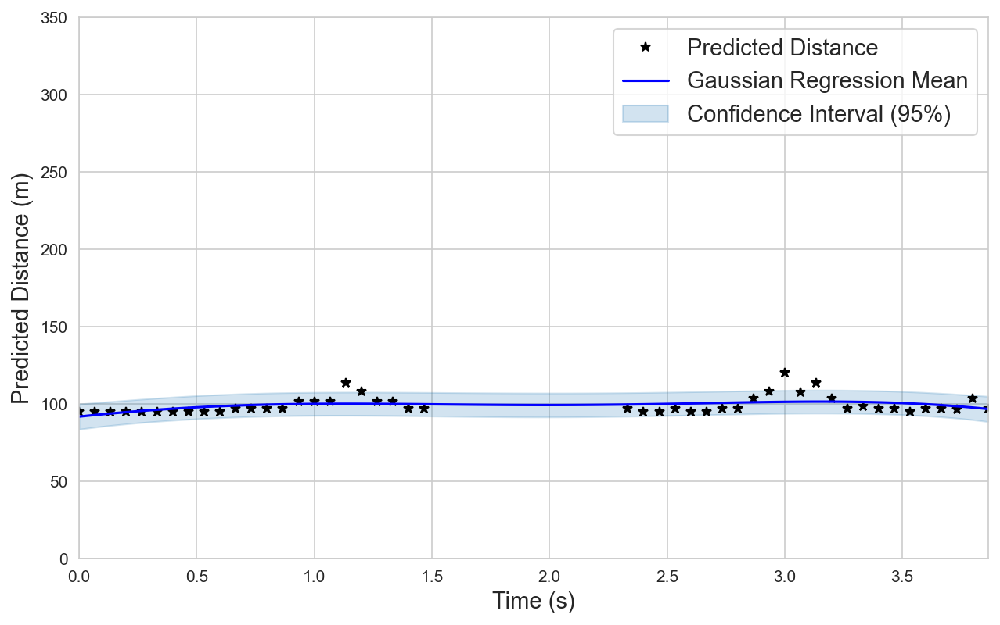

Flight 18.0 Gaussian Regression Avg CI: 9.88 m, Max CI: 10.63 m, Min CI: 8.85 m
Flight 18.0 Gaussian Regression Avg CI of mean: 19.76 m, Max CI of mean: 21.26 m, Min CI of mean: 17.70 m


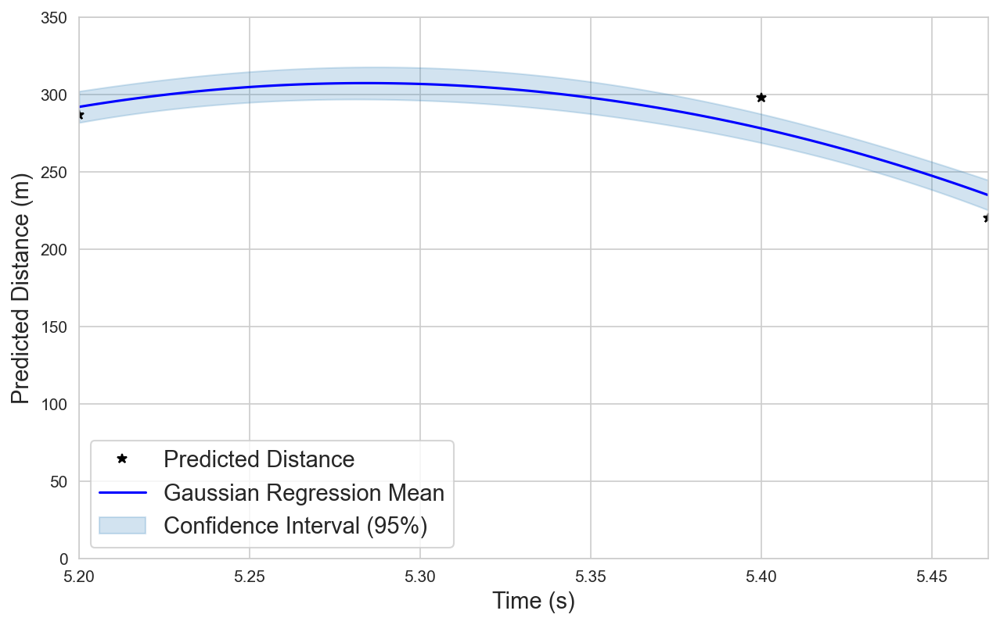

Flight 22.0 Gaussian Regression Avg CI: 9.14 m, Max CI: 10.07 m, Min CI: 8.74 m
Flight 22.0 Gaussian Regression Avg CI of mean: 18.28 m, Max CI of mean: 20.13 m, Min CI of mean: 17.48 m


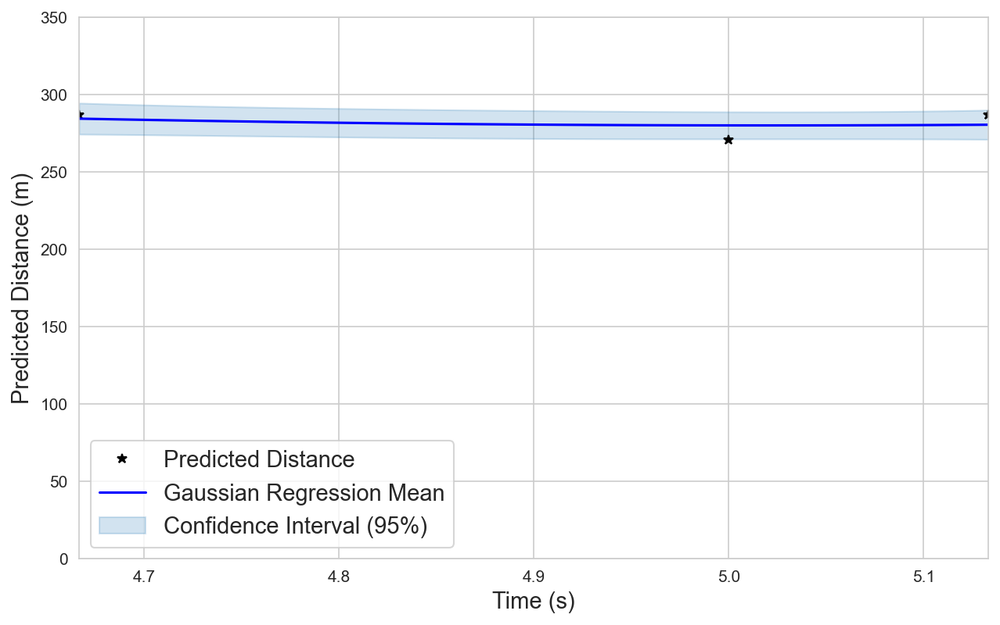

Flight 30.0 Gaussian Regression Avg CI: 8.45 m, Max CI: 9.34 m, Min CI: 8.06 m
Flight 30.0 Gaussian Regression Avg CI of mean: 16.89 m, Max CI of mean: 18.68 m, Min CI of mean: 16.12 m


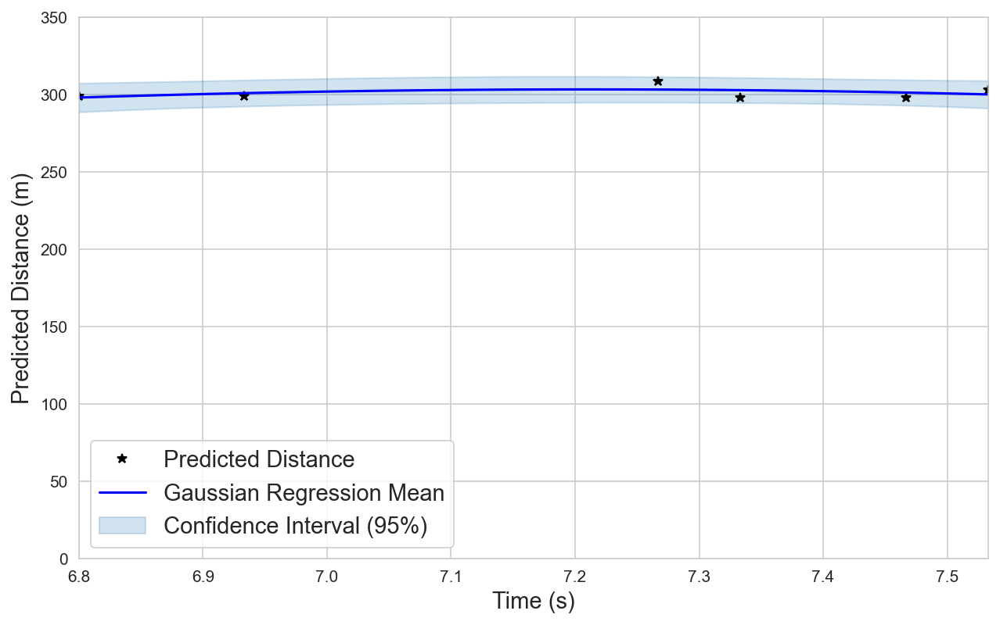

Flight 34.0_1 Gaussian Regression Avg CI: 8.07 m, Max CI: 9.02 m, Min CI: 7.86 m
Flight 34.0_1 Gaussian Regression Avg CI of mean: 16.15 m, Max CI of mean: 18.04 m, Min CI of mean: 15.73 m


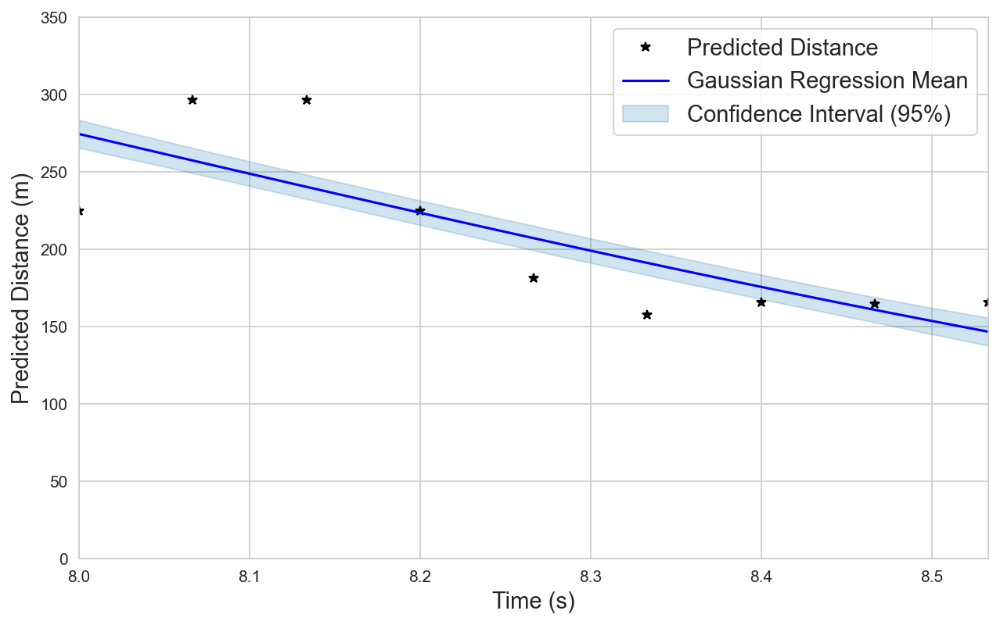

Flight 41.0 Gaussian Regression Avg CI: 249.39 m, Max CI: 588.28 m, Min CI: 8.00 m
Flight 41.0 Gaussian Regression Avg CI of mean: 498.78 m, Max CI of mean: 1176.56 m, Min CI of mean: 16.00 m


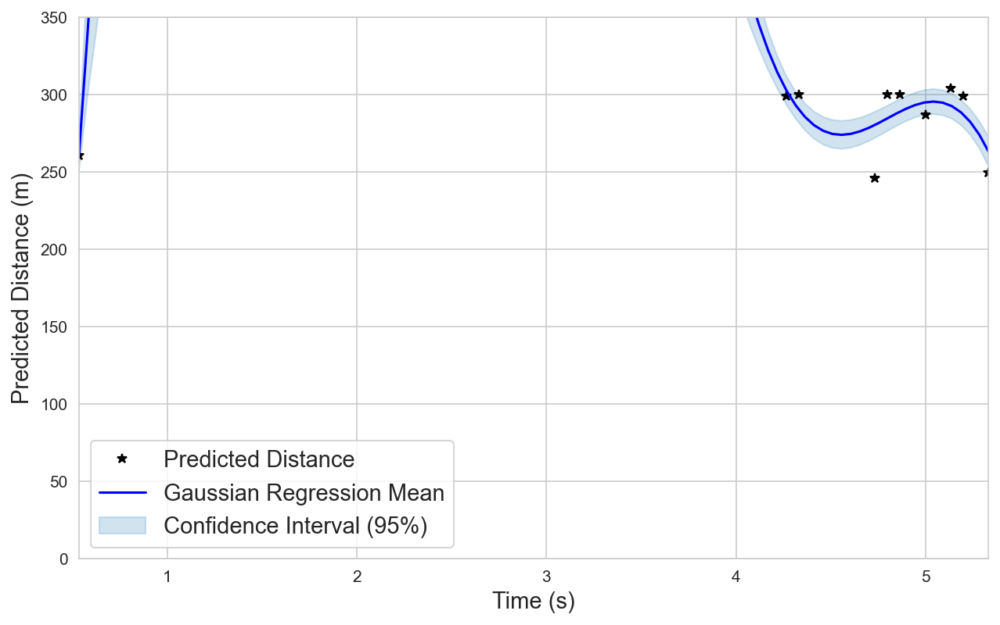

Flight 43.0 Gaussian Regression Avg CI: 7.79 m, Max CI: 8.63 m, Min CI: 7.59 m
Flight 43.0 Gaussian Regression Avg CI of mean: 15.58 m, Max CI of mean: 17.25 m, Min CI of mean: 15.18 m


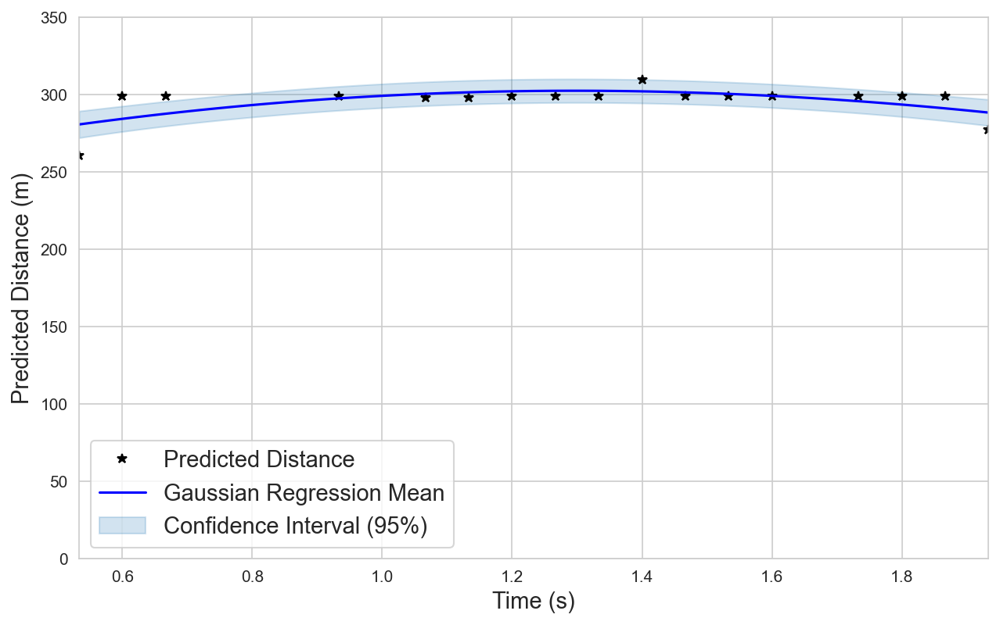

Flight 76.0 Gaussian Regression Avg CI: 8.55 m, Max CI: 10.11 m, Min CI: 7.59 m
Flight 76.0 Gaussian Regression Avg CI of mean: 17.11 m, Max CI of mean: 20.22 m, Min CI of mean: 15.19 m


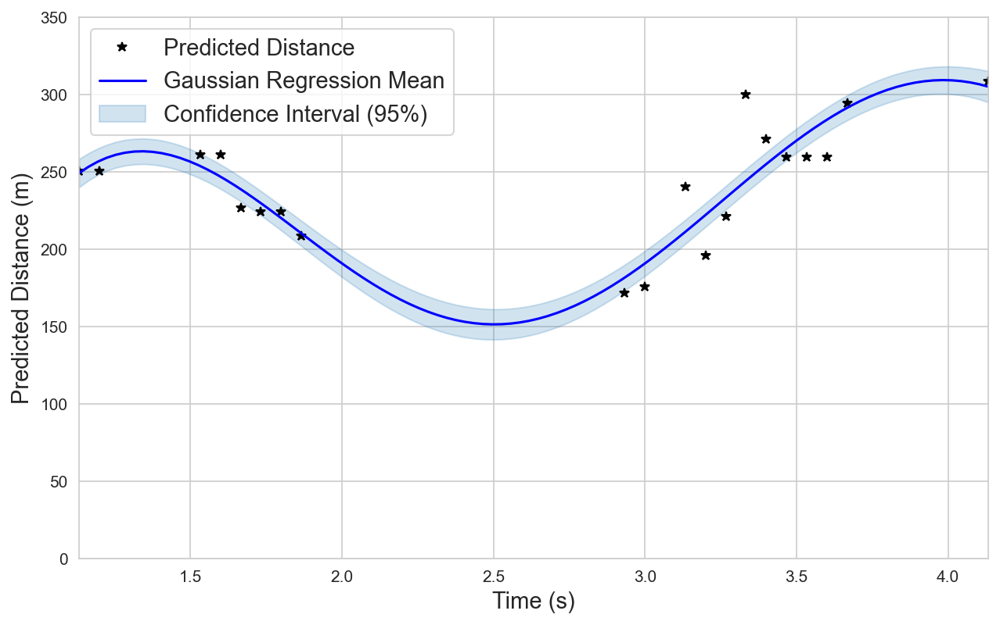

Flight 98.0 Gaussian Regression Avg CI: 9.10 m, Max CI: 9.73 m, Min CI: 8.54 m
Flight 98.0 Gaussian Regression Avg CI of mean: 18.20 m, Max CI of mean: 19.47 m, Min CI of mean: 17.08 m


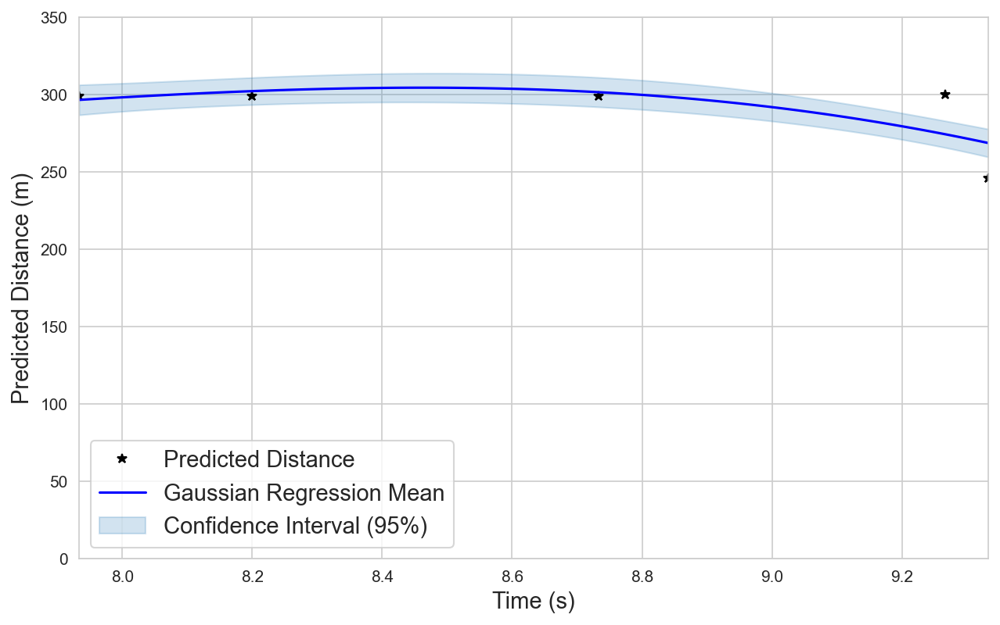

Flight 101.0 Gaussian Regression Avg CI: 8.29 m, Max CI: 10.03 m, Min CI: 7.81 m
Flight 101.0 Gaussian Regression Avg CI of mean: 16.57 m, Max CI of mean: 20.07 m, Min CI of mean: 15.62 m


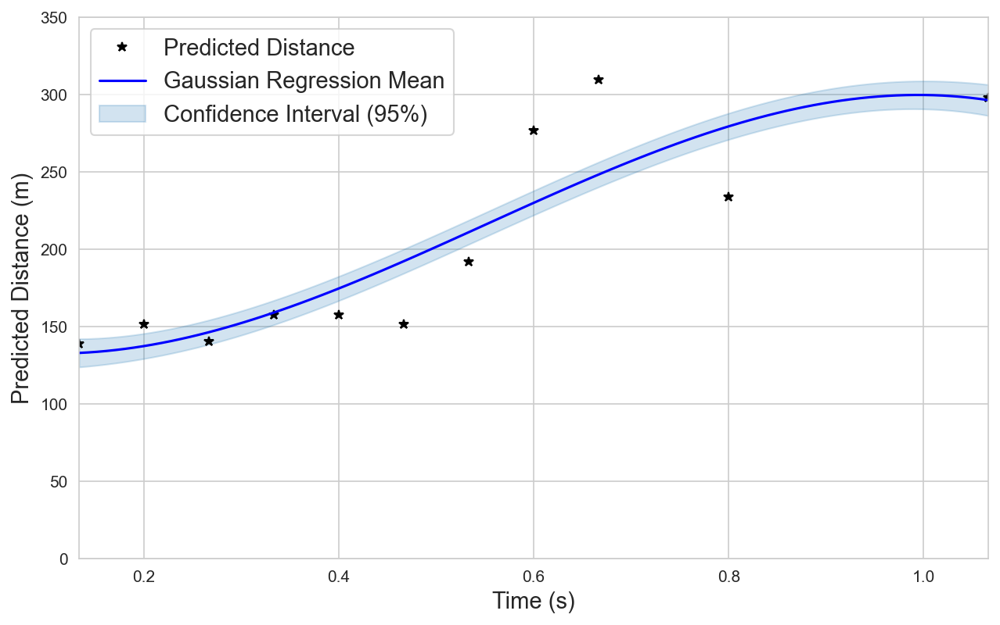

Flight 162.0 Gaussian Regression Avg CI: 9.83 m, Max CI: 12.03 m, Min CI: 7.84 m
Flight 162.0 Gaussian Regression Avg CI of mean: 19.67 m, Max CI of mean: 24.07 m, Min CI of mean: 15.68 m


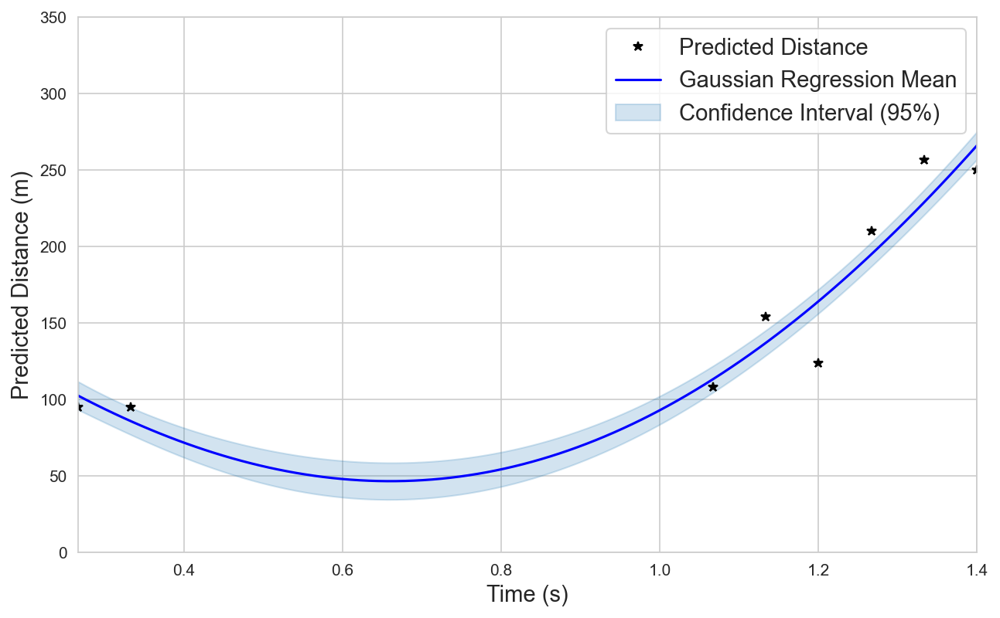

Flight 1.0_20 Gaussian Regression Avg CI: 7.94 m, Max CI: 8.91 m, Min CI: 7.74 m
Flight 1.0_20 Gaussian Regression Avg CI of mean: 15.89 m, Max CI of mean: 17.82 m, Min CI of mean: 15.48 m


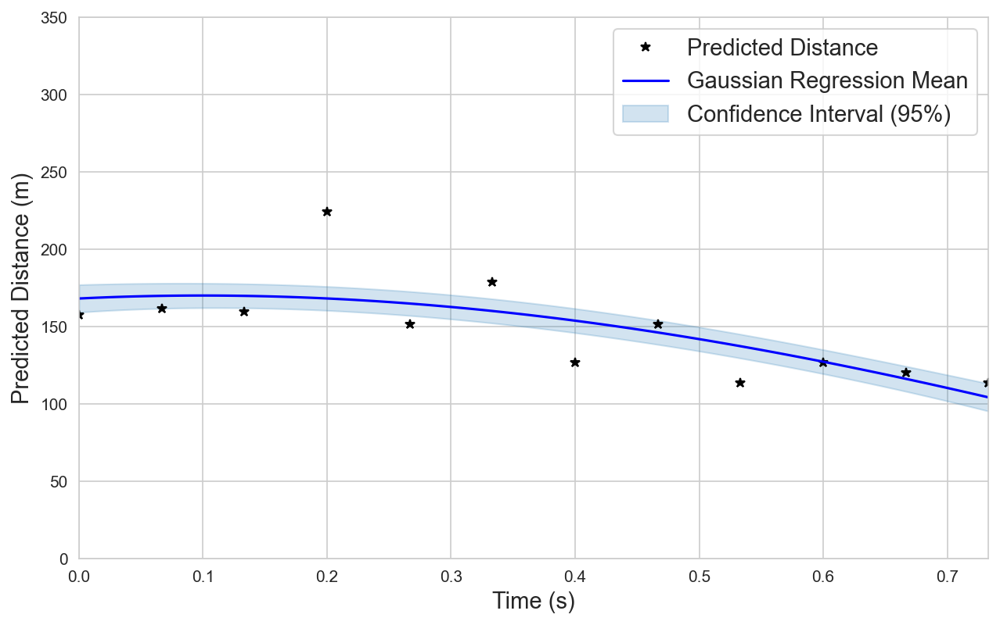

Flight 3.0_2 Gaussian Regression Avg CI: 7.55 m, Max CI: 8.85 m, Min CI: 7.44 m
Flight 3.0_2 Gaussian Regression Avg CI of mean: 15.10 m, Max CI of mean: 17.70 m, Min CI of mean: 14.87 m


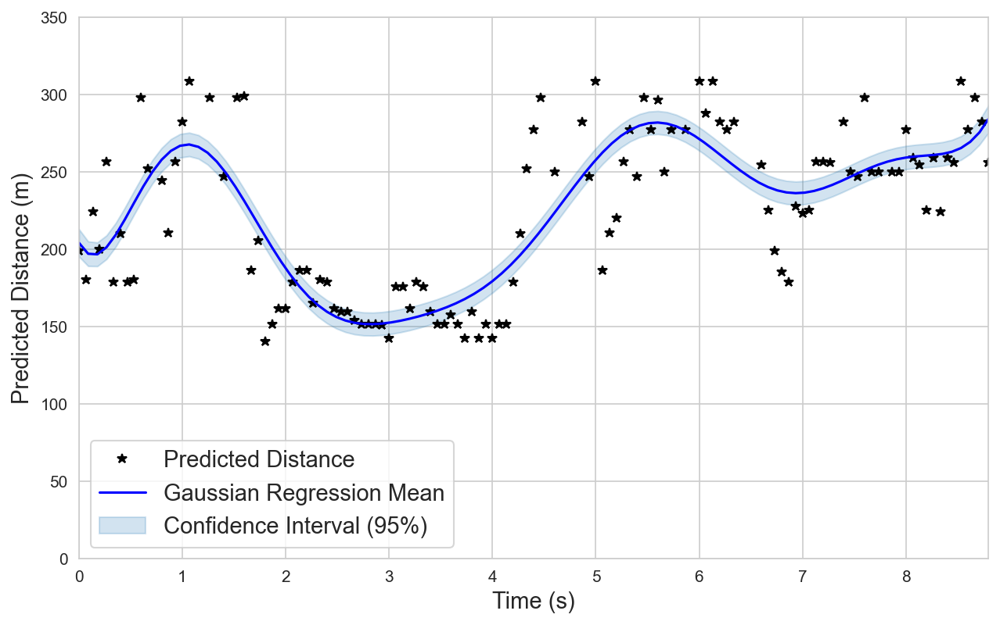

Flight 7.0 Gaussian Regression Avg CI: 7.89 m, Max CI: 10.16 m, Min CI: 7.52 m
Flight 7.0 Gaussian Regression Avg CI of mean: 15.79 m, Max CI of mean: 20.31 m, Min CI of mean: 15.04 m


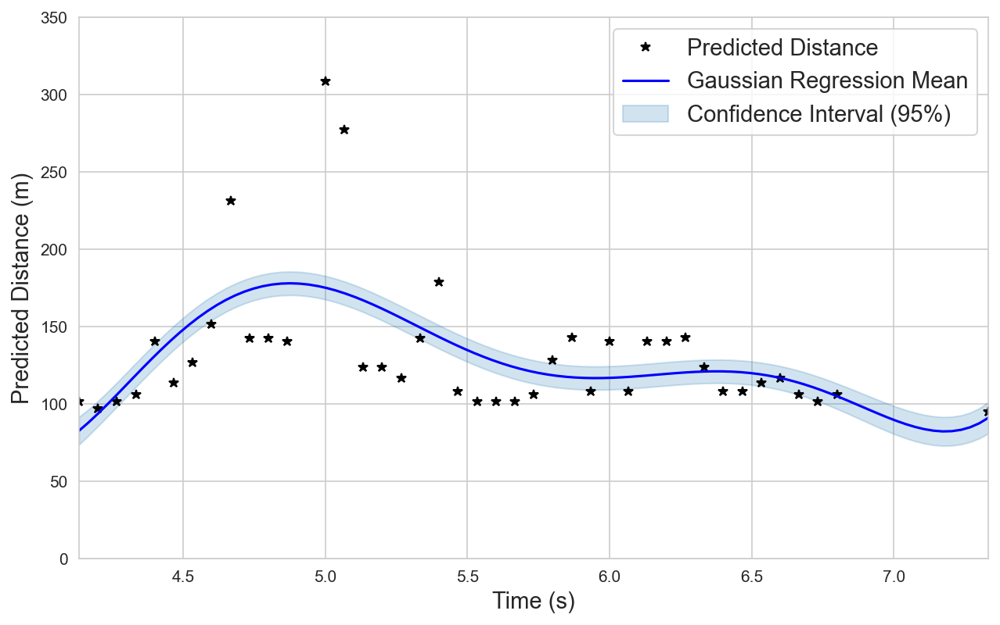

Flight 20.0 Gaussian Regression Avg CI: 11.36 m, Max CI: 25.07 m, Min CI: 7.53 m
Flight 20.0 Gaussian Regression Avg CI of mean: 22.71 m, Max CI of mean: 50.13 m, Min CI of mean: 15.05 m


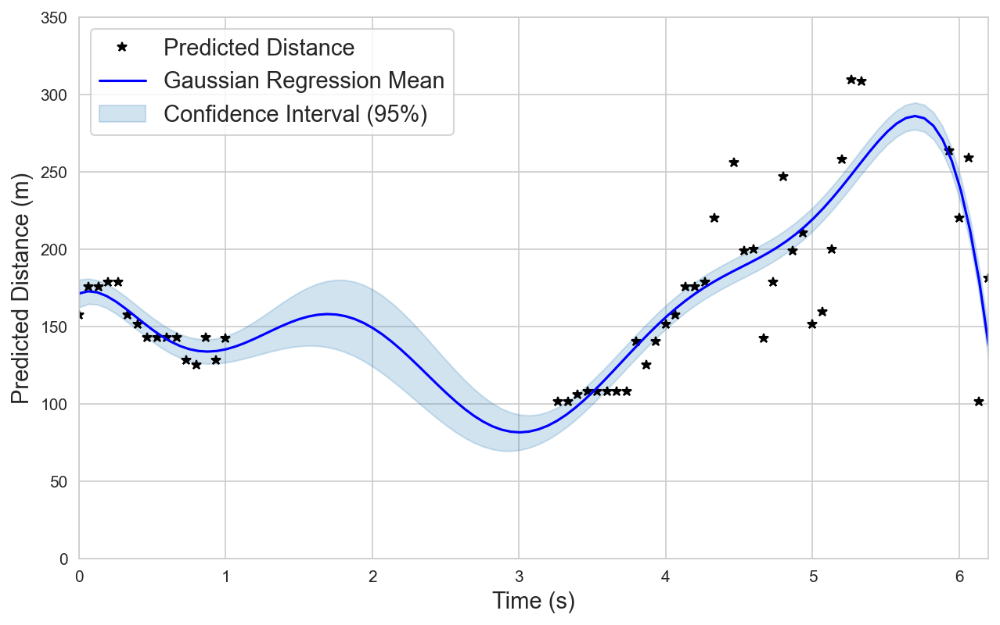

Flight 27.0 Gaussian Regression Avg CI: 15.52 m, Max CI: 21.01 m, Min CI: 8.32 m
Flight 27.0 Gaussian Regression Avg CI of mean: 31.04 m, Max CI of mean: 42.02 m, Min CI of mean: 16.65 m


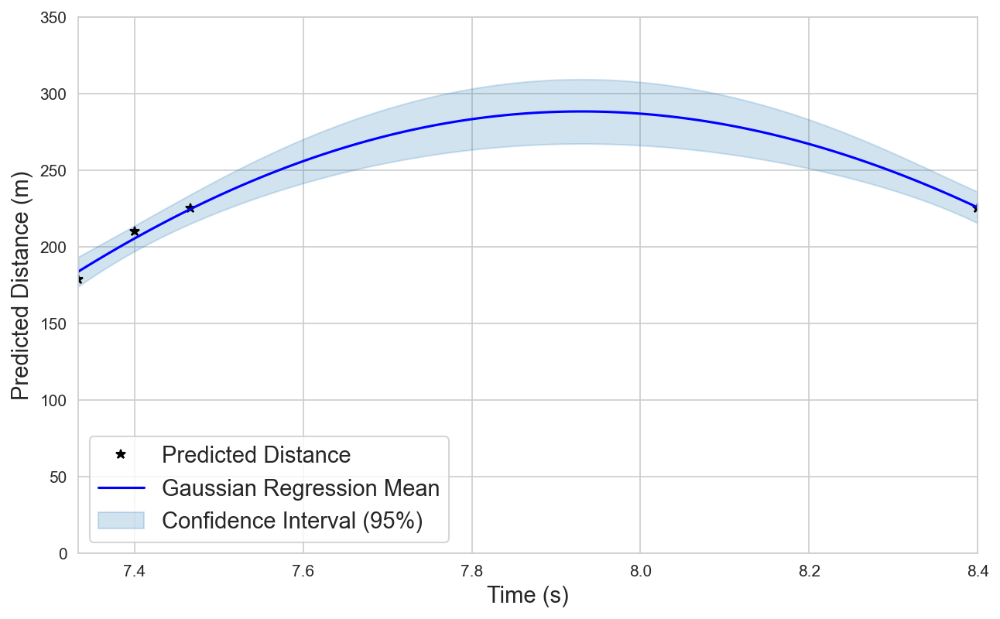

Flight 30.0_1 Gaussian Regression Avg CI: 12.81 m, Max CI: 17.22 m, Min CI: 7.90 m
Flight 30.0_1 Gaussian Regression Avg CI of mean: 25.62 m, Max CI of mean: 34.43 m, Min CI of mean: 15.81 m


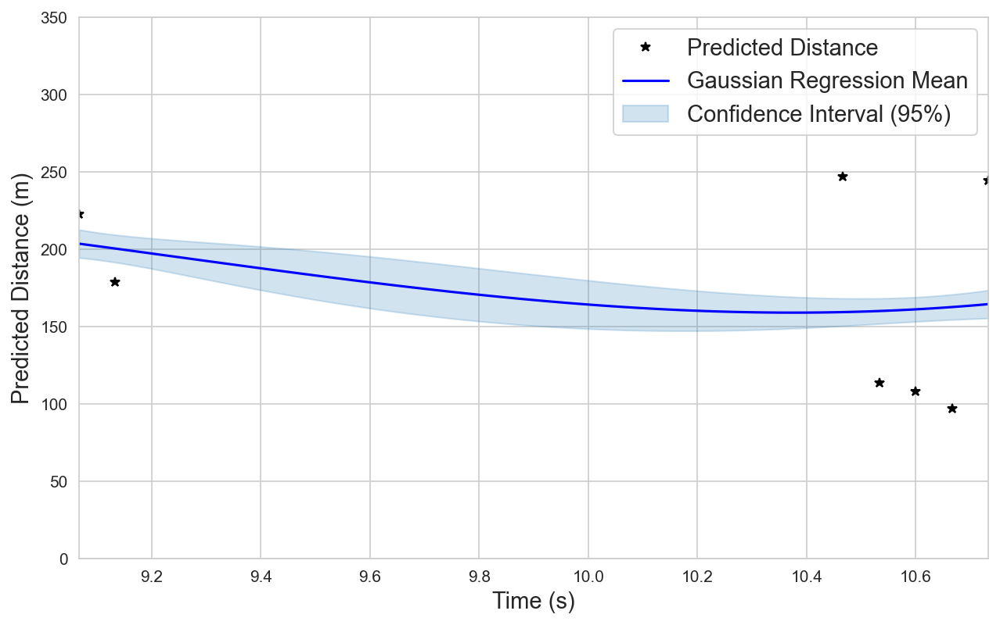

Flight 4.0_1 Gaussian Regression Avg CI: 7.97 m, Max CI: 9.06 m, Min CI: 7.65 m
Flight 4.0_1 Gaussian Regression Avg CI of mean: 15.94 m, Max CI of mean: 18.12 m, Min CI of mean: 15.31 m


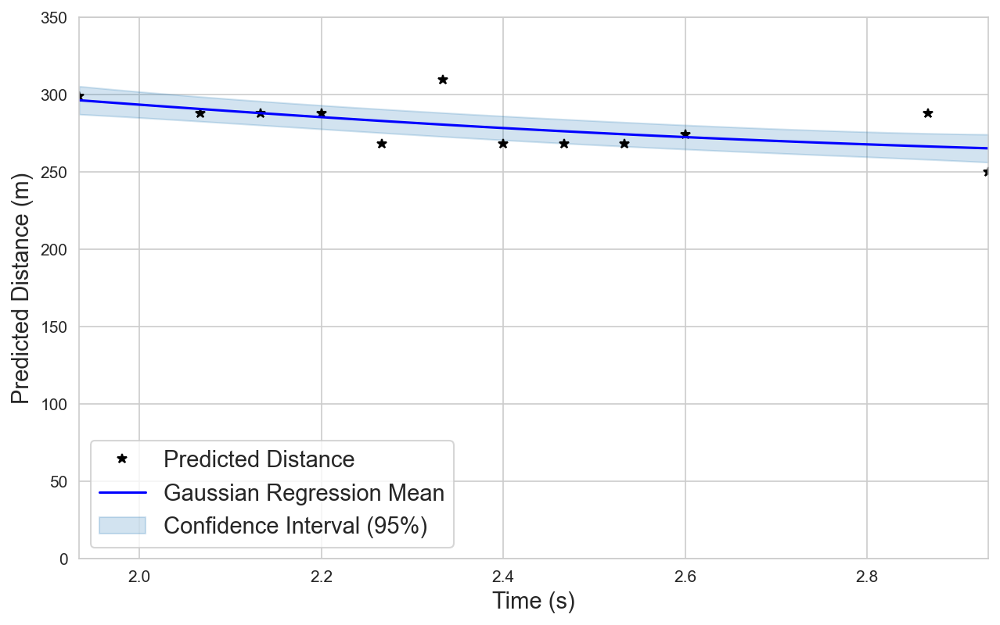

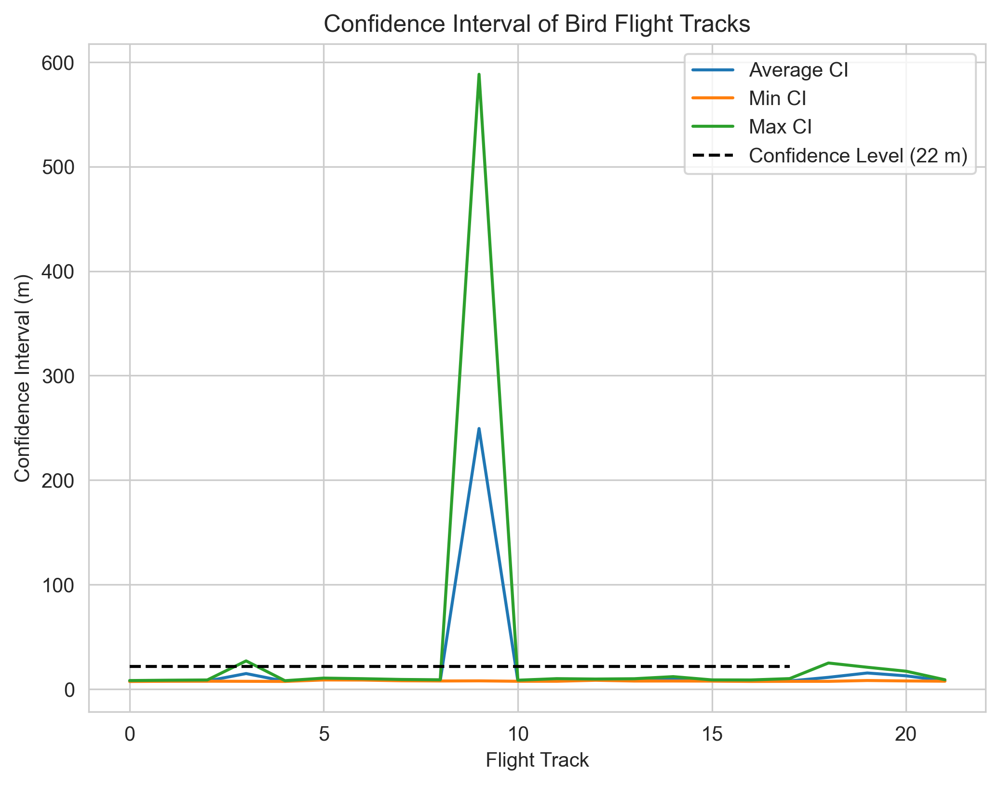

In [430]:
# Set the seed for reproducibility 
np.random.seed(42)
variance = 1
lengthscale = 1.0
ci_vector_avg = []
ci_vector_min = []
ci_vector_max = []
bPLOT = False

dicFLights = {}

for bf in bird_flight_fii:
    if len(bird_flight_fii[bf][0])  > 2:
        # if bf not in tracks_id_article:
        #     continue
        if bPLOT:
            fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
            # fig.suptitle(f'Bird flight track {bf}')
        for aaa in [True]: #, False]:
            # plt.plot(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1],label='Predicted Distance')

            if aaa:
                gpr = GaussianReg(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], 
                            noise=predicted_noise, variance=4, lengthscale=2)
                name = "Gaussian Regression"
                subplot = 0
            if not aaa:
                try:
                    gpr = GaussenRegStudentT(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], 
                                             noise=predicted_noise)
                except:
                    continue
                name = "Student-T Regression"
                subplot = 1
            
           
            time = np.linspace(bird_flight_fii[bf][0][0]*1/15, bird_flight_fii[bf][0][-1]*1/15,100)
            lower_ci, upper_ci = gpr.predict_quantiles(time[:,None], quantiles=(2.5, 97.5))
            dif_ci = (upper_ci - lower_ci)/2
            # print(f"Flight {bf} {name} Avg CI: {np.mean(dif_ci):.2f} m, Max CI: {np.max(dif_ci):.2f} m, Min CI: {np.min(dif_ci):.2f} m")
            if aaa:
                ci_vector_avg.append(np.mean(dif_ci))
                ci_vector_min.append(np.min(dif_ci))
                ci_vector_max.append(np.max(dif_ci))
            # axes[subplot]

            mean_of_function, variance_of_function = gpr.predict_noiseless(time[:,None])
            # Calculate the CI of the mean function
            std_dev_of_function = np.sqrt(variance_of_function)
            lower_ci_of_mean = mean_of_function - 1.96 * std_dev_of_function
            upper_ci_of_mean = mean_of_function + 1.96 * std_dev_of_function
            print(f"Flight {bf} {name} Avg CI: {np.mean(dif_ci):.2f} m, Max CI: {np.max(dif_ci):.2f} m, Min CI: {np.min(dif_ci):.2f} m")
            print(f"Flight {bf} {name} Avg CI of mean: {np.mean(upper_ci - lower_ci):.2f} m, Max CI of mean: {np.max(upper_ci - lower_ci):.2f} m, Min CI of mean: {np.min(upper_ci - lower_ci):.2f} m")
            if bPLOT:
                gpr.plot(ax=axes[subplot])
                axes[subplot].set_title(name)
                axes[subplot].set_xlabel('Time (s)')
                axes[subplot].set_ylabel('Predicted Distance (m)')
                axes[subplot].set_ylim(0, 500)
                axes[subplot].set_xlim(bird_flight_fii[bf][0][0]*1/15, bird_flight_fii[bf][0][-1]*1/15)

                gpr.plot(ax=axes)
                # axes.set_title(name, fontsize=14)
                axes.set_xlabel('Time (s)', fontsize=12)
                axes.set_ylabel('Predicted Distance (m)', fontsize=12)
                axes.set_ylim(0, 350)
                axes.set_xlim(bird_flight_fii[bf][0][0]*1/15, bird_flight_fii[bf][0][-1]*1/15)
                
                display(gpr)

            plt.figure(figsize=(10, 6), dpi=150) 
            plt.plot(bird_flight_fii[bf][0]*1/15, bird_flight_fii[bf][1], '*',label='Predicted Distance',c='k')
            plt.plot(time, mean_of_function, label='Gaussian Regression Mean',c='b')
            plt.fill_between(time, lower_ci.flatten(), upper_ci.flatten(), color='tab:blue', alpha=0.2, label='Confidence Interval (95%)')
            plt.legend(fontsize=14)
            plt.xlabel('Time (s)', fontsize=14)
            plt.ylabel('Predicted Distance (m)', fontsize=14)
            plt.ylim(0, 350)
            plt.xlim(bird_flight_fii[bf][0][0]*1/15, bird_flight_fii[bf][0][-1]*1/15)

            plt.show()

                # axes.plot(time, lower_ci, label='Mean of function', color='b',linestyle=':')
                # axes.plot(time, upper_ci, label='Mean of function', color='b',linestyle=':')
            
            dicFLights[bf] = {}
            dicFLights[bf]['gpr'] = gpr
            dicFLights[bf]['time'] = time
            dicFLights[bf]['lower_ci'] = lower_ci
            dicFLights[bf]['upper_ci'] = upper_ci
            dicFLights[bf]['mean_of_function'] = mean_of_function
        if bPLOT:
            plt.show()

        # break


plt.plot(ci_vector_avg, label='Average CI')
plt.plot(ci_vector_min, label='Min CI')
plt.plot(ci_vector_max, label='Max CI')
plt.plot([0,17],[22,22], 'k--', label='Confidence Level (22 m)')
plt.xlabel('Flight Track')
plt.ylabel('Confidence Interval (m)')
plt.title('Confidence Interval of Bird Flight Tracks')
# plt.ylim(0,50)
plt.legend()
plt.show()


In [431]:
print(f"Average CI: {np.mean(ci_vector_avg):.2f} m, Min CI: {np.mean(ci_vector_min):.2f} m, Max CI: {np.mean(ci_vector_max):.2f} m")

Average CI: 20.24 m, Min CI: 7.85 m, Max CI: 38.14 m


# RISKs

From get_risks noetbook

In [432]:
## Cabo de transmissão de energia

# Dados do cabo
w = 2.2204  # kgf/m
T0 = 3095.3485  # kgf
# Parâmetro da catenária
a_LT = T0 / w
## Cabo de sinalização e para raio
# Dados do cabo
w =  690/1000 # kgf/m # 690 kgf/km
T0 = 1038.479  # kgf

# Parâmetro da catenária
a_marker = T0 / w

caternarias = {
    "TransmissionLine": a_LT,
    "OverheadWireMarker": a_marker
}


In [433]:
# Function definitions
import cv2
from scipy.interpolate import interp1d
from scipy.optimize import minimize


def get_angles(camera_matrix, coordinates, VERBOSE = False):
    # coordinates is the boundbox of the image
    x = (coordinates[0] + coordinates[2])/2
    y = (coordinates[1] + coordinates[3])/2
    mtx, dist = np.array(data['camera_matrix']), np.array(data['dist_coeff'])

    src = np.array([[[x, y]]], dtype=np.float32)
    x_n, y_n = cv2.undistortPoints(src, cameraMatrix= mtx
                                    , distCoeffs= dist)[0][0]
    # theta_h = np.arctan2(x_n, 1)
    # theta_v = np.arctan2(y_n, 1)
    
    # theta_azimute = np.arctan2(x_n, y_n)
    # phi_polar = np.arccos(1 / np.sqrt(x_n**2 + y_n**2 + 1))

    theta_azimute = np.arctan2(1,x_n)
    phi_polar = np.arccos(y_n / np.sqrt(x_n**2 + y_n**2 + 1) )

    if VERBOSE:
        print(f"pixesl ({x},{y}) \t-> normalized pos: ({x_n:.2}, {y_n:.2}, 1) \t-> angle (azimute, polar): " + \
              f"({np.rad2deg(theta_azimute):.3}º, {np.rad2deg(phi_polar):.3}º) \t-> 800*cos: ({800*np.cos(theta_azimute):.1f},{800*np.cos(phi_polar):.1f})")

    return theta_azimute, phi_polar

def rot_x(theta):
    rot_matrix = np.array([
        [1,        0,           0       ],
        [0, np.cos(theta), -np.sin(theta)],
        [0, np.sin(theta), np.cos(theta)]
    ])
    return(rot_matrix)

def catenaria(x,a_cat):
    return a_cat * np.cosh(x / a_cat)


def height_catenary(y,a_cat):
    flecha = catenaria(L/2,a_cat) - a_cat 
    H = catenaria(y-L/2)-a_cat+altura_torre-flecha
    return H
class c_result():
    ## mimic the result class from minimiz
    def __init__(self):
        pass
def distance_by_vector(x_bird, y_bird, z_bird, x_cable, h_delta_cable,a_cat, N=5000):
    # Method to find distance when gradient fails
    min_distance = 9999
    y_opt = 0
    flecha = catenaria(L/2,a_cat) - a_cat 
    delta = 0
    for y in np.arange(0,L,L/N):
        z_catenary = catenaria(y-L/2,a_cat)-a_cat+ (altura_torre-h_delta_cable) -flecha
        distance = np.sqrt((x_cable - x_bird)**2 + (y - y_bird)**2 + (z_catenary - z_bird)**2)
        if distance < min_distance:
            min_distance = distance
            y_opt = y
            delta = [x_bird - x_cable, y_bird - y, z_bird - z_catenary]
    result = c_result
    result.x = [y_opt]
    result.fun = min_distance

    return result, delta
    


def distances_to_catenary(vector_cartesian):
    distances = []
    vector_optimal_y = []
    markers = []
    deltas = []
    cable_name = 'NAN'
    for bird_pos in vector_cartesian:
        x_bird, y_bird, z_bird = bird_pos
        min_distance = 9999
        final_result = 0
        delta = [0, 0, 0]
        for cable in caternarias:
            if cable == "OverheadWireMarker":
                h_cable = 13.27 #m Height of Transmission Line cable in reference to the overhead wire marker
            else:
                h_cable = 0
            a_cat = caternarias[cable]
            flecha = catenaria(L/2,a_cat) - a_cat
            for x_cable in [-metade_horizontal, metade_horizontal]:
                def objective_function(y):
                    # Calculate the distance between the point and the catenary at a given y
                    z_catenary = catenaria(y-L/2,a_cat)- a_cat + (altura_torre - h_cable) - flecha
                    distance = np.sqrt((x_cable - x_bird)**2 + (y - y_bird)**2 + (z_catenary - z_bird)**2)
                    return distance

                # Use minimize to find the y that minimizes the distance
                result = minimize(objective_function, (y_bird), bounds=[(0, L)]) #bounds=[(min(y), max(y))]
                
                if not result.success:
                    # print(f"Optimization failed for bird position {x_bird, y_bird, z_bird} and cable {cable}. Using fallback method.")
                    result,delta = distance_by_vector(x_bird, y_bird, z_bird,x_cable,h_cable, a_cat)
                else:
                    y_aux = result.x[0]
                    delta = [x_bird - x_cable, 
                             y_bird - y_aux, 
                             z_bird - (catenaria(y_aux-L/2,a_cat)-a_cat + (altura_torre - h_cable) - flecha)]
                if result.fun < min_distance:
                    final_result = result
                    min_distance = result.fun
                    cable_name = cable
                    delta_min = delta
                    # bird_pos_min = bird_pos

        deltas.append(delta_min)
        optimal_y = final_result.x[0]
        min_distance = final_result.fun
        vector_optimal_y.append(optimal_y)
        distances.append(min_distance)
        markers.append(cable_name)
    return distances, vector_optimal_y, markers, deltas


def interpolate_flight(track, X):
    """
    Interpolates the predicted distance for a bird flight track.

    Parameters:
        track (list): [frames, distances ] as in 
        X (list): frames to use to return the interpolated distances.
    Returns:
        interp_func: A function that takes frame(s) and returns interpolated distance(s).
    """
    kind='linear'
    fill_value='extrapolate'
    frames = np.array(track[0])
    distances = np.array(track[1])
    if len(frames) < 2:
        # Not enough points to interpolate
        return lambda x: np.full_like(np.atleast_1d(x), distances[0] if len(distances) > 0 else np.nan)
    interp_func = interp1d(frames, distances, kind=kind, fill_value=fill_value, bounds_error=False)

    Y = interp_func(X)
    return Y


# # Dados do cabo
# w = 2.2204  # kgf/m
# T0 = 3095.3485  # kgf
# L = 828.64  # m
# h = -0  # m (desnível)
# a_cat = T0 / w
# flecha = catenaria(L/2) - a_cat
L = 975.30 #799.50  # m
altura_torre = (115360 + 9640) * 10**-3
altura_camera = (12000 + 4360 + 12000 + 2500)* 10**-3
metade_horizontal = 14300 * 10**-3

rotation_angle = np.deg2rad(7)
rotatation_matrix = rot_x(rotation_angle)

In [434]:
import yaml
import cv2
with open("calibration_matrix.yaml", "r") as f:
    data = yaml.safe_load(f)
data
h,  w = (1080,1920)
mtx = np.array(data['camera_matrix'])
dist = np.array(data['dist_coeff'])

In [435]:
tracking_3d = {}
distance_95 = {}

MIN_DISTANCE = 80
MAX_DISTANCE = 600
FPS = 15

c1 = 0
c2 = 0

for CSV in CSVs:
    dfDistance = pd.read_csv(CSV)

    for track_id, sub in dfDistance.groupby('track_id'):
        while track_id in tracking_3d:
            track_id = new_track_id(track_id)
        if track_id not in dicFLights.keys(): #bird_flight_fii.keys(): # 
            # print(f"Skipping track_id {track_id} in {CSV} as it is not in bird_flight_filtered")
            c1+=1
            continue
        if len(bird_flight_fii[track_id])  < 2:
            c2+=1
            # print(f"Skipping track_id {track_id}, w {len(bird_flight_fii[track_id])} and {len(bird_flight_fii[track_id][0])}")
            continue

                
        tracking_3d[track_id] = {}
        vector_angles = []
        vector_radius = []
        vector_dist_cable = []
        vector_cartesian = []
        vector_cartesian_floor = []
        time_vector = []
        vector_theta = []
        vector_phi = []
        
        for i, row in sub.iterrows():
            coordinates = (row['coordinates_x1'], row['coordinates_y1'],
                        row['coordinates_x2'], row['coordinates_y2'])
            
            bird_flight_fii[track_id]

            time_vector.append(row['current_frame']/FPS)
            theta_azimute, phi_polar = get_angles(data, coordinates) 
            vector_theta.append(theta_azimute)
            vector_phi.append(phi_polar)
            # vector_angles.append((theta_azimute, phi_polar, radius))
        
        time_vector_new = dicFLights[track_id]['time']
        # interporlate angles and use X as the radius
        if len(time_vector) > 1:
            # vector_theta = interpolate_flight( (time_vector, vector_theta), X = bird_flight_fii[track_id][3][0]  )
            # vector_phi = interpolate_flight( (time_vector, vector_phi), X = bird_flight_fii[track_id][3][0]  )
            vector_theta = interpolate_flight( (time_vector, vector_theta), X = time_vector_new  )
            vector_phi = interpolate_flight( (time_vector, vector_phi), X = time_vector_new  )
        else:
            print(f"{track_id}")

        time_vector = time_vector_new
        # print(dicFLights[track_id]['time'])
        # print(time_vector)
        
        # radius = bird_flight_fii[track_id][3][1]
        radius = dicFLights[track_id]['mean_of_function'].flatten()
        X_vec = radius * np.sin(vector_phi) * np.cos(vector_theta)
        Y_vec = radius * np.sin(vector_phi) * np.sin(vector_theta)
        Z_vec = radius * np.cos(vector_phi)
        for i in range(len(X_vec)):
            x = X_vec[i]
            y = Y_vec[i]
            z = Z_vec[i]
            xyz_rotated = rotatation_matrix@np.array([[x],[y],[z]])
            vector_cartesian.append((xyz_rotated.reshape(1,-1))[0])
            vector_cartesian_floor.append((xyz_rotated.reshape(1,-1))[0] + [0,0,altura_camera])

        vector_dist_cable,vector_optimal_y,vector_markers,deltas = distances_to_catenary(vector_cartesian_floor)

        tracking_3d[track_id]['Cartesian'] = vector_cartesian_floor
        tracking_3d[track_id]['Height'] = [a[2] + altura_camera for a in vector_cartesian]
        tracking_3d[track_id]['Dist_cable'] = vector_dist_cable
        tracking_3d[track_id]['Cable_y'] = vector_optimal_y
        tracking_3d[track_id]['Markers'] = vector_markers
        tracking_3d[track_id]['time'] = time_vector
        tracking_3d[track_id]['radius'] = vector_radius
        tracking_3d[track_id]['deltas'] = deltas
        


        ## Calc distance to cable from the 95% confidence interval
        distance_95[track_id] = {}

        for lamb in np.linspace(0, 1, 20):
            radius = dicFLights[track_id]['lower_ci']*lamb + (1-lamb)*dicFLights[track_id]['upper_ci'] 
            radius = radius.flatten()
            X_vec = radius * np.sin(vector_phi) * np.cos(vector_theta)
            Y_vec = radius * np.sin(vector_phi) * np.sin(vector_theta)
            Z_vec = radius * np.cos(vector_phi)
            for i in range(len(X_vec)):
                x = X_vec[i]
                y = Y_vec[i]
                z = Z_vec[i]
                xyz_rotated = rotatation_matrix@np.array([[x],[y],[z]])
                vector_cartesian.append((xyz_rotated.reshape(1,-1))[0])
                vector_cartesian_floor.append((xyz_rotated.reshape(1,-1))[0] + [0,0,altura_camera])

            vector_dist_cable,vector_optimal_y,vector_markers,deltas = distances_to_catenary(vector_cartesian_floor)
            
            distance_95[track_id][lamb] = {}
            distance_95[track_id][lamb]['Distance'] = vector_dist_cable
            distance_95[track_id][lamb]['Markers'] = vector_markers
            distance_95[track_id][lamb]['Deltas'] = deltas


print(f"Tracking 3D data for {len(tracking_3d)} tracks.")
print(f"skipped {c1}, {c2}")

4.0_1
Tracking 3D data for 16 tracks.
skipped 90, 0


In [436]:
def catenary_params(marker,x):
    a_cat = caternarias[marker]
    flecha = catenaria(L/2,a_cat) - a_cat
    if marker == "OverheadWireMarker":
        h_delta_vertical = 0 
    else:
        h_delta_vertical = 13.27 #m 
    compare_x =  abs(x - metade_horizontal) < \
                 abs(x + metade_horizontal)
    if compare_x:    # Find which X coordinate is closer to the catenary (because I didn't saved before)
        x_cat = metade_horizontal
    else:
        x_cat = -metade_horizontal
    return a_cat, flecha, h_delta_vertical, x_cat

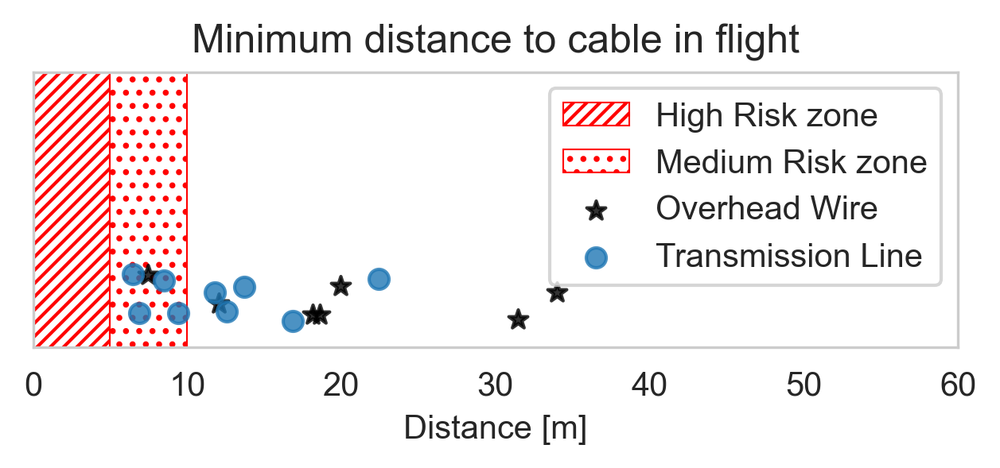

In [437]:
min_heights = [] # altura minima por voo
max_heights = [] # alutra maxima por voo
min_dists_cable = [] # minima distancia ate o cabo por voo
markers = [] # markers do cabo mais proximo
delta_height = []
delta_horizontal = [] 
delta_y = [] # delta y do ponto mais proximo do cabo

deltas = [] # delta x, y, z do ponto mais proximo do cabo
for trac in tracking_3d:
    if len(tracking_3d[trac]['Height']) == 0:
        print(trac)
        continue

    min_heights.append([min(tracking_3d[trac]['Height'])])
    max_heights.append([max(tracking_3d[trac]['Height'])])
    
    min_dists_cable.append(min(tracking_3d[trac]['Dist_cable']))
    idx = tracking_3d[trac]['Dist_cable'].index(min(tracking_3d[trac]['Dist_cable']))
    markers.append(tracking_3d[trac]['Markers'][idx])

    if min_dists_cable[-1] < 5:
        print(f"Track {trac}. Bird pos: ({tracking_3d[trac]['Cartesian'][idx][0]:.2f}, {tracking_3d[trac]['Cartesian'][idx][1]:.2},{tracking_3d[trac]['Height'][idx]:.2f}) m")
    # find point where the bird was when we have 
    # index_min = tracking_3d[trac]['Dist_cable'].index(min_dists_cable[-1])
    y_min_dist = tracking_3d[trac]['Cable_y'][idx]
    x_min_dist = tracking_3d[trac]['Cartesian'][idx][0]
    a_cat, flecha, h_delta_vertical, x_cat = catenary_params(tracking_3d[trac]['Markers'][idx], x_min_dist)

    z_catenary = catenaria(y_min_dist-L/2,a_cat) - a_cat + (altura_torre - h_delta_vertical) - flecha


    delta_height.append(tracking_3d[trac]['Height'][idx] - z_catenary)
    delta_horizontal.append(x_min_dist - x_cat)
    delta_y.append(y_min_dist - tracking_3d[trac]['Cartesian'][idx][1] )
    delta = tracking_3d[trac]['deltas'][idx]
    deltas.append(delta)
    # if min_dists_cable[-1] < 15:
    #     print(f"Track {trac}. Bird pos: ({x_min_dist:.2f}, {tracking_3d[trac]['Cartesian'][idx][1]:.2},{tracking_3d[trac]['Height'][idx]:.2f}) m")
    #     print(f"Track {trac}. Cable pos:({x_cat:.2f}, {y_min_dist:.2},{z_catenary:.2f}) m")
    #     print(f"Track {trac}. Delta height: {delta_height[-1]:.2f} m, Delta horizontal: {delta_horizontal[-1]:.2f} m, Delta y: {delta_y[-1]:.2f} m")
    #     print(f"-> distance = {np.sqrt(delta_height[-1]**2 + delta_horizontal[-1]**2 + delta_y[-1]**2):.2f} m Versus {min_dists_cable[-1]:.2f} m")
# plt.figure(figsize=[10,4])
# plt.subplot(121)
# plt.scatter(min_heights,min_dists_cable)
# plt.xlabel('Altura Mínima de voo')
# plt.ylabel('Distancia minima do cabo no voo')
# plt.ylim([0,60])
# plt.grid()
# plt.subplot(122)
# plt.scatter(max_heights,min_dists_cable)
# plt.xlabel('Altura Máxima de voo')
# plt.ylabel('Distancia minima do cabo no voo')
# plt.ylim([0,60])
# plt.grid()
# plt.show()

min_dists_cable = np.array(min_dists_cable)
delta_height = np.array(delta_height)
th = 10

th_1 = 5
th_2 = 10


fig = plt.figure(figsize=[5,1.5])
ax = fig.add_subplot(111)
y1 = [-1, -1]
y2 = [1, 1]
ax.fill_between([-1, th_1], y1, y2 , color='none',hatch="//////", edgecolor="r",linewidth=.5, label='High Risk zone')
ax.fill_between([th_1, th_2], y1, y2 , color='none',hatch="...", edgecolor="r",linewidth=.5, label='Medium Risk zone')
# plt.scatter(delta_height[min_dists_cable<th],min_dists_cable[min_dists_cable<th])
# plt.scatter(delta_height,min_dists_cable)

distOverhead = min_dists_cable[np.array(markers) == 'OverheadWireMarker']
distTransmissionLone = min_dists_cable[np.array(markers) != 'OverheadWireMarker']
# plt.scatter(min_dists_cable,np.zeros(len(min_dists_cable)),label='Bird flight')

plt.scatter(distOverhead,.2*np.random.random(len(distOverhead)),label='Overhead Wire',marker='*',alpha=.8,c='k')
plt.scatter(distTransmissionLone,.2*np.random.random(len(distTransmissionLone)),label='Transmission Line',marker='o',alpha=.8)

plt.title("Minimum distance to cable in flight")
# plt.xlabel('Altura Passaro - Altura cabo')
plt.xlabel('Distance [m]')
plt.ylim([-.1,1])
plt.xlim([0,60])
# plt.plot([th_1,th_1],[-1,13],'--r',label='High risk')
# plt.plot([th_2,th_2],[-1,13],':r',label='Medium risk')
# plt.yticks(np.arange(0, 25, 5))
plt.yticks([])
plt.legend()
plt.grid()
plt.show()


In [438]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.path import Path

# Define the vertices for the bird shape
# I've designed these points to form a simple, recognizable bird silhouette.
bird_vertices = np.array([
    (0, 0),        # 0: Tail base
    (-0.1, 0.1),   # 1: Tail tip up
    (-0.2, 0.1),   # 2: Tail tip up
    (-0.3, 0),     # 3: Tail tip middle
    (-0.2, -0.1),  # 4: Tail tip down
    (-0.1, -0.1),  # 5: Tail tip down
    (0, 0),        # 6: Back to tail base
    (0.2, 0.2),    # 7: Body top
    (0.4, 0.3),    # 8: Head top
    (0.5, 0.2),    # 9: Beak tip
    (0.45, 0.15),  # 10: Beak bottom
    (0.3, 0.1),    # 11: Neck
    (0.1, -0.2),   # 12: Wing tip
    (0, 0)         # 13: Back to tail base to close
])

# Define the path codes for the bird shape
# These codes tell Matplotlib how to draw the lines between the vertices.
bird_codes = [
    Path.MOVETO,    # Start at the tail base
    Path.LINETO,    # Draw to tail tip
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,    # Complete the tail
    Path.LINETO,    # Draw the back
    Path.LINETO,    # Draw the head
    Path.LINETO,    # Draw the beak
    Path.LINETO,
    Path.LINETO,    # Draw the neck/chest
    Path.LINETO,    # Draw the wing
    Path.CLOSEPOLY, # Close the shape
]

# Create the Path object for the bird marker
bird_marker = Path(bird_vertices, bird_codes)

bird_vertices = np.array([
    (0, 0),        # 0: Tail base
    (-0.1, 0.1),   # 1: Tail tip up
    (-0.2, 0.1),   # 2: Tail tip up
    (-0.3, 0),     # 3: Tail tip middle
    (-0.2, -0.1),  # 4: Tail tip down
    (-0.1, -0.1),  # 5: Tail tip down
    (0, 0),        # 6: Back to tail base
    (0.2, 0.2),    # 7: Body top
    (0.4, 0.3),    # 8: Head top
    (0.5, 0.2),    # 9: Beak tip
    (0.45, 0.15),  # 10: Beak bottom
    (0.3, 0.1),    # 11: Neck
    (0.1, -0.2),   # 12: Wing tip
    (0, 0)         # 13: Back to tail base to close
])

# --- Rotate the bird marker 90 degrees ---
# Define the rotation angle (90 degrees in radians)
angle = np.pi / 2
# Create the 2D rotation matrix
rotation_matrix = np.array([
    [np.cos(angle), -np.sin(angle)],
    [np.sin(angle),  np.cos(angle)]
])
# Apply the rotation to the vertices using matrix multiplication
rotated_bird_vertices = np.dot(bird_vertices, rotation_matrix)

# Define the path codes for the first bird shape
bird_codes = [
    Path.MOVETO, Path.LINETO, Path.LINETO, Path.LINETO, Path.LINETO,
    Path.LINETO, Path.LINETO, Path.LINETO, Path.LINETO, Path.LINETO,
    Path.LINETO, Path.LINETO, Path.LINETO, Path.CLOSEPOLY,
]

# Create the Path object for the rotated bird marker
rotated_bird_marker = Path(rotated_bird_vertices, bird_codes)

x_min: -24.326645429958003, x_max: 15.230222287875254, y_min: -33.11446007030309, y_max: 12.60033426177884


Text(0, 0.5, 'Vertical distance to cable [m]')

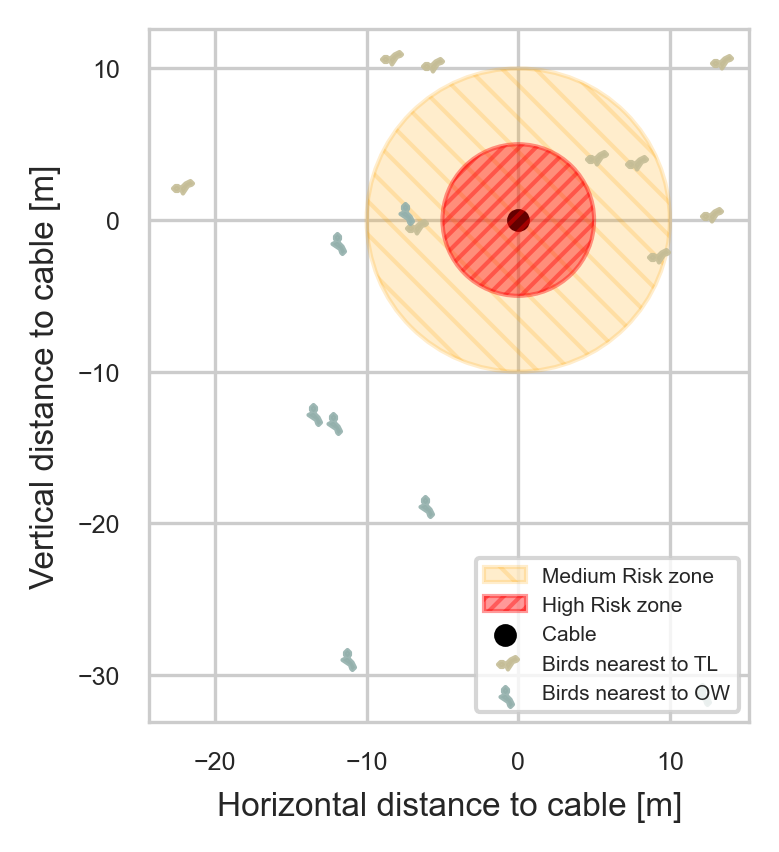

In [439]:
horizontal_distances = [np.sqrt(d[0]**2 + d[1]**2) for d in deltas] 
horizontal_distances = np.array( [d[0] for d in deltas] )
vertical_distances   = np.array( [d[2] for d in deltas] )
fig, ax = plt.subplots(figsize=[3,3]) # note we must use plt.subplots, not plt.subplot

hor_dist_overhead = horizontal_distances[np.array(markers) == 'OverheadWireMarker']
hor_dist_TL = horizontal_distances[np.array(markers) != 'OverheadWireMarker']


ver_dist_overhead = vertical_distances[np.array(markers) == 'OverheadWireMarker']
ver_dist_TL = vertical_distances[np.array(markers) != 'OverheadWireMarker']



# # Create the plot
# fig, ax = plt.subplots(figsize=[8, 8])
# # Set aspect ratio to equal to ensure circles are not distorted
# # Add risk zones (draw larger circle first, then smaller circle on top)
# ax.add_patch(plt.Circle((0, 0), th_2, alpha=0.2, label='Medium Risk zone', hatch="\\\\\\", zorder=1, facecolor='#FFA500', edgecolor='#FFA500'))
# ax.add_patch(plt.Circle((0, 0), th_1, alpha=0.4, label='High Risk zone', facecolor='red', edgecolor='red', zorder=2))
# # Plot cable
# plt.scatter(0, 0, label='Cable', marker='o', s=50, c='k')
# # Plot bird positions using custom bird markers
# plt.scatter(hor_dist_TL, ver_dist_TL, alpha=0.9, marker=bird_marker, label='Birds nearest to TL', c="#C5BD964E", s=400)
# plt.scatter(hor_dist_overhead, ver_dist_overhead, alpha=0.9, marker=rotated_bird_marker, label='Birds nearest to OW', c="#93B0AC45", s=400)

# # Calculate actual data ranges for better axis limits
# x_min, x_max = min(horizontal_distances) - 2, max(horizontal_distances) + 2
# y_min, y_max = min(vertical_distances) - 2, max(vertical_distances) + 2
 
# # Set axes limits and labels
# plt.xlim([x_min, x_max])
# plt.ylim([y_min, y_max])
# plt.xlabel('Horizontal distance to cable [m]', fontsize=14)
# plt.ylabel('Vertical distance to cable [m]', fontsize=14)
# plt.tick_params(labelsize=12)
# # Add grid
# ax.grid(True, linestyle='--', alpha=0.3)
# # Add legend
# plt.legend(fontsize=12, loc='lower right')
# plt.savefig("risk_plot.png", dpi=300, bbox_inches='tight')
 
# # Show the plot
# plt.show()

x_min, x_max = min(horizontal_distances) - 2, max(horizontal_distances) + 2
y_min, y_max = min(vertical_distances) - 2, max(vertical_distances) + 2
print(f"x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")

ax.add_patch(plt.Circle((0, 0), th_2,      alpha=.2, label='Medium Risk zone',hatch="\\\\\\",facecolor='#FFA500', edgecolor='#FFA500'))
ax.add_patch(plt.Circle((0, 0), th_1,      alpha=.4, label='High Risk zone',hatch="//////",facecolor='red', edgecolor='red', zorder=2))
plt.scatter(0,0, label='Cable', marker='o',s=20,c='k')

plt.scatter(hor_dist_TL, ver_dist_TL,             alpha=.9, marker=bird_marker, label='Birds nearest to TL'  ,c="#C5BD964E" )
plt.scatter(hor_dist_overhead, ver_dist_overhead, alpha=.9, marker=rotated_bird_marker, label='Birds nearest to OW'   ,c="#93B0AC45")
# plt.scatter(horizontal_distances, vertical_distances, alpha=.5)
plt.xlim([x_min, x_max])
plt.ylim([y_min, y_max])
ax.set_aspect('equal')
plt.tick_params(labelsize=6)
plt.legend(fontsize=5,loc='lower right')
# plt.title('Position of the minimum bird to cable distance',fontsize=8)
plt.xlabel('Horizontal distance to cable [m]' ,fontsize=8)
plt.ylabel('Vertical distance to cable [m]'   ,fontsize=8)

In [440]:
print(th_1, th_2)

num_overhead_th_1 = np.sum(distOverhead < th_1)
num_overhead_th_2 = np.sum((distOverhead >= th_1) & (distOverhead < th_2))
num_transmission_th_1 = np.sum(distTransmissionLone < th_1)
num_transmission_th_2 = np.sum((distTransmissionLone >= th_1) & (distTransmissionLone < th_2))

df = pd.DataFrame({
    'Risk': ['High Risk', 'Medium Risk', 'Low Risk'],
    'Overhead Wire': [num_overhead_th_1, num_overhead_th_2, len(distOverhead) - num_overhead_th_1 - num_overhead_th_2],
    'Transmission Line': [num_transmission_th_1, num_transmission_th_2, len(distTransmissionLone) - num_transmission_th_1 - num_transmission_th_2],
    'Total': [num_overhead_th_1+num_transmission_th_1, num_transmission_th_2+num_overhead_th_2, 
              len(distOverhead) + len(distTransmissionLone) - num_overhead_th_1 
              - num_overhead_th_2 - num_transmission_th_1 - num_transmission_th_2]}
    )

df['Overhead Wire (%)'] = (df['Overhead Wire'] / len(distOverhead) * 100).round(2)
df['Transmission Line (%)'] = (df['Transmission Line'] / len(distTransmissionLone) * 100).round(2)
df['Total (%)'] = (df['Total'] / (len(distOverhead) + len(distTransmissionLone)) * 100).round(2)

df

5 10


,Risk,Overhead Wire,Transmission Line,Total,Overhead Wire (%),Transmission Line (%),Total (%)
0,High Risk,0,0,0,0.00,0.00,0.00
1,Medium Risk,1,4,5,14.29,44.44,31.25
2,Low Risk,6,5,11,85.71,55.56,68.75


Min distance for the 95% confidence interval: [11.88691502 20.83742997  9.92450755 11.91991029 15.64791716  4.90405297
  8.0040438   7.47765555 12.5815847   6.69261202 18.6742727   8.96713312
 32.52175036 18.24230894 17.49479664 30.43357466]
Min distance for the avg: [12.03891799 22.43000347 11.80710672 13.69828169 16.86588966  6.4503556
  8.49599236  7.48024587 12.58161675  6.88198321 19.92910672  9.42922968
 33.97396221 18.60723434 18.12004261 31.44249274]


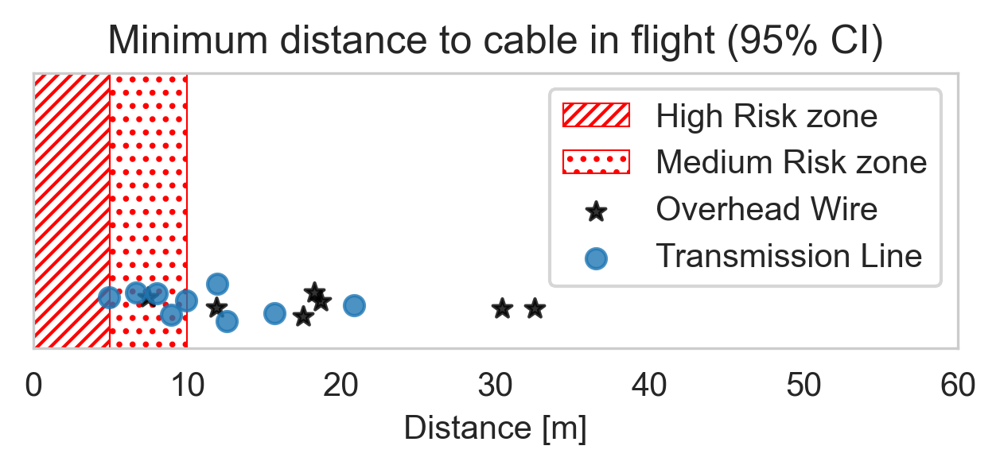

In [441]:


# Min distance for the 95% confidence interval
# Compute minimal distances 
new_min_dists_cable = []
new_markers = []
new_delta_height = []
new_delta_horizontal = []
new_deltas = []
for key in distance_95:
    min_distance = 99999
    ##########

    #####
    for lamb in distance_95[key]:
        if lamb == 'min':
            continue
        aux_min = np.min(distance_95[key][lamb]['Distance'])
        ix = np.argmin(distance_95[key][lamb]['Distance'])
        aux_marker = distance_95[key][lamb]['Markers'][ix]
        # x_min_dist_aux = distance_95[key][lamb]['Cartesian'][ix][0]
        if aux_min < min_distance:
            min_distance = aux_min
            marker = aux_marker
            new_delta = distance_95[key][lamb]['Deltas'][ix]
    new_markers.append(marker)
    new_min_dists_cable.append(min_distance)
    new_deltas.append(new_delta)
    # print(f"Track {key} min distance: {min_distance:.2f} m, {new_min_dists_cable[-1]:.2f} m")

# PLOT THOSE DISTANCES
new_min_dists_cable = np.array(new_min_dists_cable)
print(f"Min distance for the 95% confidence interval: {new_min_dists_cable}")
print(f"Min distance for the avg: {min_dists_cable}")
fig = plt.figure(figsize=[5,1.5])
ax = fig.add_subplot(111)
y1 = [-1, -1]
y2 = [1, 1]
ax.fill_between([-1, th_1], y1, y2 , color='none',hatch="//////", edgecolor="r",linewidth=.5, label='High Risk zone')
ax.fill_between([th_1, th_2], y1, y2 , color='none',hatch="...", edgecolor="r",linewidth=.5, label='Medium Risk zone')
# plt.scatter(delta_height[min_dists_cable<th],min_dists_cable[min_dists_cable<th])
# plt.scatter(delta_height,min_dists_cable)

distOverhead = new_min_dists_cable[np.array(new_markers) == 'OverheadWireMarker']
distTransmissionLone = new_min_dists_cable[np.array(new_markers) != 'OverheadWireMarker']

# plt.scatter(new_min_dists_cable,np.zeros(len(new_min_dists_cable)),label='Bird flight')
plt.scatter(distOverhead,.2*np.random.random(len(distOverhead)),label='Overhead Wire',marker='*',alpha=.8,c='k')
plt.scatter(distTransmissionLone,.2*np.random.random(len(distTransmissionLone)),label='Transmission Line',marker='o',alpha=.8)

plt.title("Minimum distance to cable in flight (95% CI)")
# plt.xlabel('Altura Passaro - Altura cabo')
plt.xlabel('Distance [m]')
plt.ylim([-.1,1])
plt.xlim([0,60])
# plt.plot([th_1,th_1],[-1,13],'--r',label='High risk')
# plt.plot([th_2,th_2],[-1,13],':r',label='Medium risk')
# plt.yticks(np.arange(0, 25, 5))
plt.yticks([])
plt.legend()
plt.grid()
plt.show()

In [442]:
print(th_1, th_2)
num_overhead_th_1 = np.sum(distOverhead < th_1)
num_overhead_th_2 = np.sum((distOverhead >= th_1) & (distOverhead < th_2))
num_transmission_th_1 = np.sum(distTransmissionLone < th_1)
num_transmission_th_2 = np.sum((distTransmissionLone >= th_1) & (distTransmissionLone < th_2))

df = pd.DataFrame({
    'Risk': ['High Risk', 'Medium Risk', 'Low Risk'],
    'Overhead Wire': [num_overhead_th_1, num_overhead_th_2, len(distOverhead) - num_overhead_th_1 - num_overhead_th_2],
    'Transmission Line': [num_transmission_th_1, num_transmission_th_2
                            , len(distTransmissionLone) - num_transmission_th_1 - num_transmission_th_2],
    'Total': [num_overhead_th_1+num_transmission_th_1, num_transmission_th_2+num_overhead_th_2,
              len(distOverhead) + len(distTransmissionLone) - num_overhead_th_1
                - num_overhead_th_2 - num_transmission_th_1 - num_transmission_th_2]}
    )


df['Overhead Wire (%)'] = (df['Overhead Wire'] / len(distOverhead) * 100).round(2)
df['Transmission Line (%)'] = (df['Transmission Line'] / len(distTransmissionLone) * 100).round(2)
df['Total (%)'] = (df['Total'] / (len(distOverhead) + len(distTransmissionLone)) * 100).round(2)

print(f"95% Confidence Interval Results:\n")
df

5 10
95% Confidence Interval Results:



,Risk,Overhead Wire,Transmission Line,Total,Overhead Wire (%),Transmission Line (%),Total (%)
0,High Risk,0,1,1,0.00,11.11,6.25
1,Medium Risk,1,4,5,14.29,44.44,31.25
2,Low Risk,6,4,10,85.71,44.44,62.50


95% CI


Text(0, 0.5, 'Vertical distance to cable [m]')

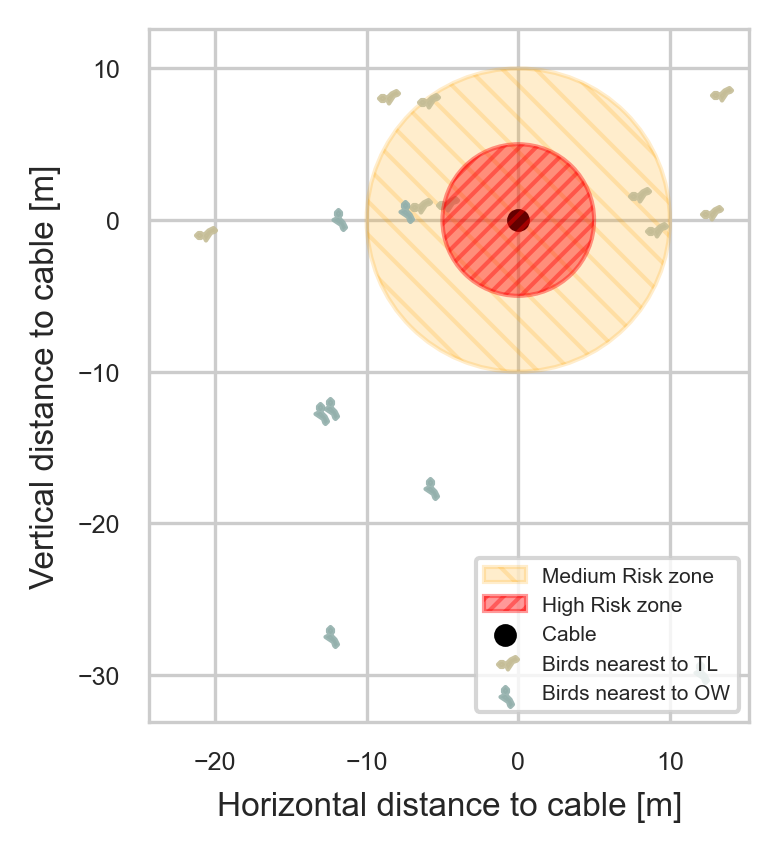

In [443]:
print("95% CI")
horizontal_distances = [np.sqrt(d[0]**2 + d[1]**2) for d in new_deltas] 
horizontal_distances = np.array( [d[0] for d in new_deltas] )
vertical_distances   = np.array( [d[2] for d in new_deltas] )
fig, ax = plt.subplots(figsize=[3,3]) # note we must use plt.subplots, not plt.subplot

hor_dist_overhead = horizontal_distances[np.array(new_markers) == 'OverheadWireMarker']
hor_dist_TL = horizontal_distances[np.array(new_markers) != 'OverheadWireMarker']


ver_dist_overhead = vertical_distances[np.array(new_markers) == 'OverheadWireMarker']
ver_dist_TL = vertical_distances[np.array(new_markers) != 'OverheadWireMarker']

ax.add_patch(plt.Circle((0, 0), th_2,      alpha=.2, label='Medium Risk zone',hatch="\\\\\\",facecolor='#FFA500', edgecolor='#FFA500'))
ax.add_patch(plt.Circle((0, 0), th_1,      alpha=.4, label='High Risk zone',hatch="//////",facecolor='red', edgecolor='red', zorder=2))
plt.scatter(0,0, label='Cable', marker='o',s=20,c='k')

plt.scatter(hor_dist_TL, ver_dist_TL,             alpha=.9, marker=bird_marker, label='Birds nearest to TL'  ,c="#C5BD964E" )
plt.scatter(hor_dist_overhead, ver_dist_overhead, alpha=.9, marker=rotated_bird_marker, label='Birds nearest to OW'   ,c="#93B0AC45")
# plt.scatter(horizontal_distances, vertical_distances, alpha=.5)
plt.xlim([x_min, x_max])
plt.ylim([y_min, y_max])
ax.set_aspect('equal')
plt.tick_params(labelsize=6)
plt.legend(fontsize=5,loc='lower right')
# plt.title('Position of the minimum bird to cable distance',fontsize=8)
plt.xlabel('Horizontal distance to cable [m]' ,fontsize=8)
plt.ylabel('Vertical distance to cable [m]'   ,fontsize=8)

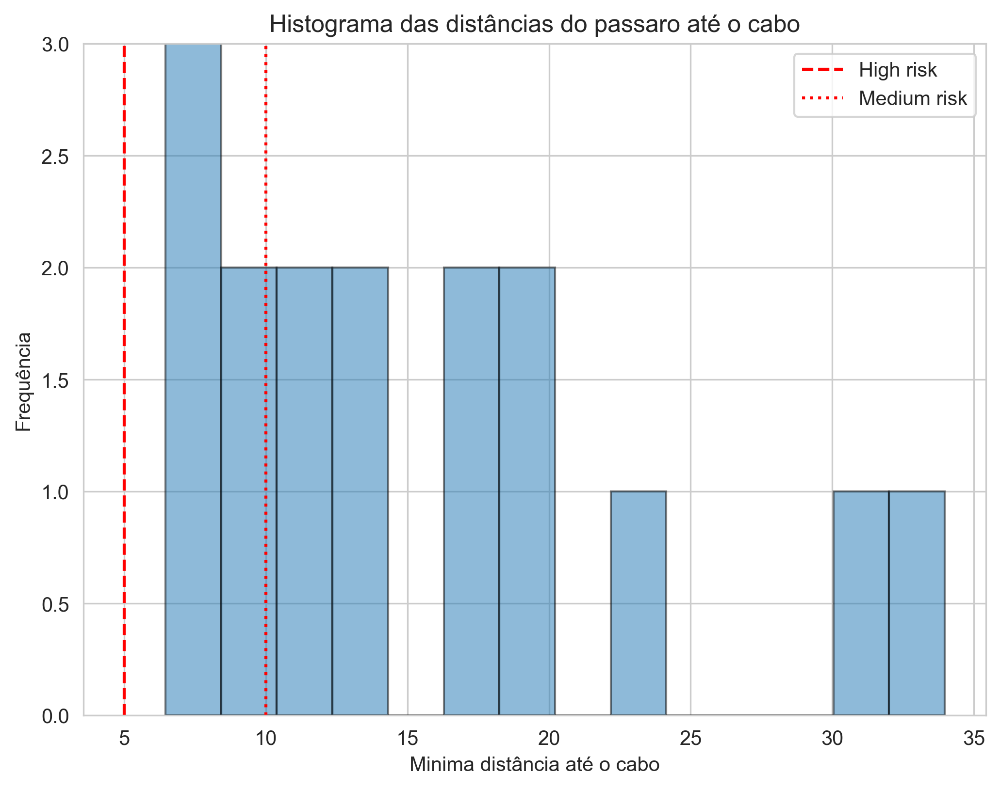

In [444]:
plt.hist((np.array(min_dists_cable).reshape(1,-1))[0], bins=14,edgecolor='black',alpha=.5)
plt.xlabel("Minima distância até o cabo")
plt.ylabel("Frequência")
plt.title("Histograma das distâncias do passaro até o cabo")
plt.plot([th_1,th_1],[0,13],'--r',label='High risk')
plt.plot([th_2,th_2],[0,13],':r',label='Medium risk')
plt.legend()
plt.ylim([0,3])
plt.show()